## 0. Importing Packages

In [1]:
# import the required packages
#Enable usage of Pandas module in working path
import pandas as pd

#Enable usage of Seaborn data visualization library in python
import seaborn as sns

#Enable usage of command style functions that make matplotlib work like MATLAB
import matplotlib.pyplot as plt

#Enable usage of array, list related operations
import numpy as np

#Enable usage of system-specific parameters and functions
import sys

#Enable usage of regular expression operations
import re

#Enable usage of functions that can create entire figures at once
import plotly.express as px

#Enable usage of a normal continuous random variable
from scipy.stats import norm

#Ensures that plot outputs appear and are stored within the notebook.
%matplotlib inline

# ensure that all columns are being displayed/not hidden when dataframe is being printed
pd.set_option('display.max_columns', None) 

## 1. HR Analytics (Classification Problem)

### 1.1 Load and Explore the data

### First 5 Rows of Dataframe

In [2]:
#Read hr_data.csv file into dataframe, df_classification
df = pd.read_csv('hr_data.csv')
df_classification = df.copy()

#Display dataframe, df_classification
df_classification.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


### Last 5 Rows of Dataframe

In [3]:
# Inspect the data inputs by returning the last 5 rows
df_classification.tail()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0
54807,51526,HR,region_22,Bachelor's,m,other,1,27,1.0,5,0,0,49,0


### Unique Columns in Dataframe

In [4]:
#Return the column labels of the dataframe
df_classification.columns### Unique Columns in Dataframe

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

### Dimensionality of Dataframe

In [5]:
# Return a tuple representing the dimensionality of the DataFrame, df_classification
df_classification.shape

(54808, 14)

### Identifying Null Values in Dataframe

In [6]:
#Print information about the DataFrame including the index dtype and columns, non-null values and memory usage.### Identifying Null Values in Dataframe
df_classification.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


### Descriptive Statistics of Dataframe

In [7]:
#Summary of central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.
df_classification.describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


### Count and Actual Unique Values for Each Column in Dataframe

In [8]:
# Display No of Unqiue Values and Actual Unique Values :

def display_unique(df_classification):
    for column in df_classification.columns :
        #Count number of distinct elements
        print("No of Unique Values in "+column+" Column are : "+str(df_classification[column].nunique()))
        #Get unique values in columns
        print("Actual Unique Values in "+column+" Column are : "+str(df_classification[column].sort_values(ascending=True,na_position='last').unique() ))
        print("")

#Call function to display
display_unique(df_classification)

No of Unique Values in employee_id Column are : 54808
Actual Unique Values in employee_id Column are : [    1     2     4 ... 78296 78297 78298]

No of Unique Values in department Column are : 9
Actual Unique Values in department Column are : ['Analytics' 'Finance' 'HR' 'Legal' 'Operations' 'Procurement' 'R&D'
 'Sales & Marketing' 'Technology']

No of Unique Values in region Column are : 34
Actual Unique Values in region Column are : ['region_1' 'region_10' 'region_11' 'region_12' 'region_13' 'region_14'
 'region_15' 'region_16' 'region_17' 'region_18' 'region_19' 'region_2'
 'region_20' 'region_21' 'region_22' 'region_23' 'region_24' 'region_25'
 'region_26' 'region_27' 'region_28' 'region_29' 'region_3' 'region_30'
 'region_31' 'region_32' 'region_33' 'region_34' 'region_4' 'region_5'
 'region_6' 'region_7' 'region_8' 'region_9']

No of Unique Values in education Column are : 3
Actual Unique Values in education Column are : ["Bachelor's" 'Below Secondary' "Master's & above" nan]

No 

### Distribution of Numerical Features in Dataframe

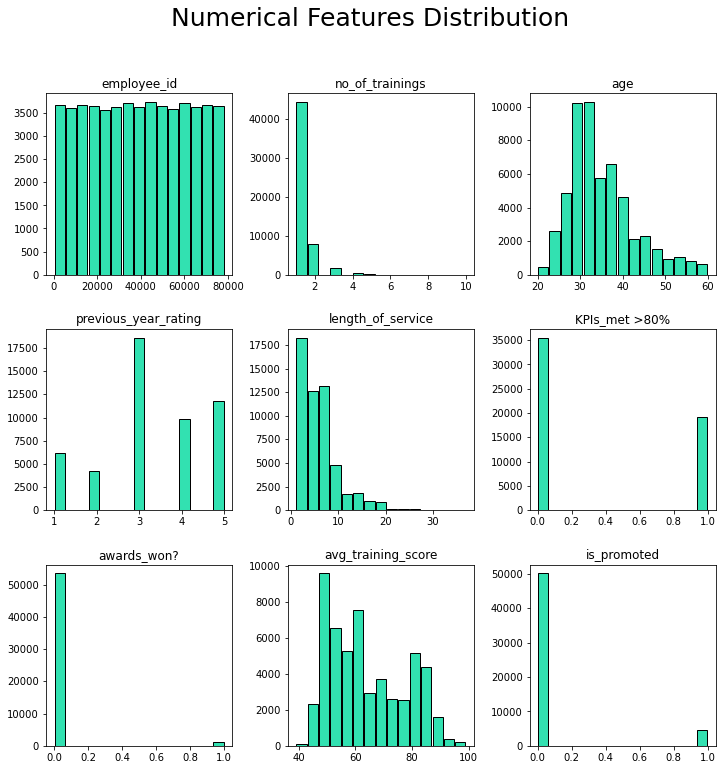

In [9]:
#Create a Histogram of Dataframe columns with 15 bins
df_classification.hist(edgecolor = 'black', bins = 15, grid = False, figsize = (12,12),
                      color = '#32E1B1', zorder = 2, rwidth = 0.9)

#Add a centred suptitle to the figure
plt.suptitle("Numerical Features Distribution", fontsize = 25)
plt.show()

### Gender Distribution in Organization

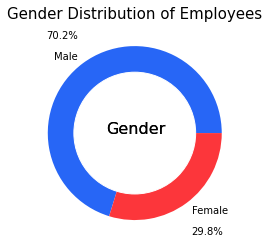

In [10]:
### Gender Distribution in Organization# create data
names = ['Male', 'Female']

# Set a title for the axes
plt.title('Gender Distribution of Employees', fontsize=15)

#Count number of male in the dataframe (i.e. 'm')
count_male = (df_classification['gender']=='m').sum()

#Count number of female in the dataframe (i.e. 'f')
count_female = (df_classification['gender']=='f').sum()

#Create list of gender count
size_of_groups=[count_male, count_female]

# Create a pieplot using list of gender count
plt.pie(size_of_groups, labels = names, colors = ['#2766F6', '#FC363B'], autopct='%1.1f%%', pctdistance=1.4, labeldistance=1.1)

# add a circle at the center to transform it in a donut chart
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
text = plt.text(-.33, 0, "Gender", fontsize=16)
p.gca().add_artist(my_circle)
p.gca().add_artist(text)
plt.show()

### Proportion of Male Employees Promoted

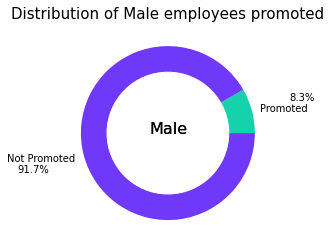

In [11]:
#Create dataframe consisting of only male gender
df_male = df_classification.loc[df_classification['gender'] == 'm']
names = ['Promoted', 'Not Promoted']
plt.title('Distribution of Male employees promoted', fontsize=15)

#Count number of male employees promoted
count_promoted = (df_male['is_promoted']== 1).sum()

#Count number of male employees not promoted
count_notpromoted = (df_male['is_promoted']== 0).sum()
size_of_groups=[count_promoted, count_notpromoted]

# Create a pieplot with count of those promoted and not promoted
plt.pie(size_of_groups, labels = names, colors = ['#15D2AD', '#7038F8'], autopct='%1.1f%%', pctdistance=1.6, labeldistance=1.1)

# Add a circle at the center to transform it in a donut chart### Proportion of Male Employees Promoted
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
text = plt.text(-.21, 0, "Male", fontsize=16)
p.gca().add_artist(my_circle)
p.gca().add_artist(text)
plt.show()

### Proportion of Female Employees Promoted

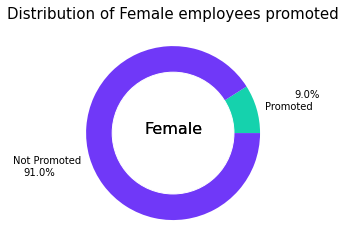

In [12]:
#Create dataframe consisting of only female gender
df_female = df_classification.loc[df_classification['gender'] == 'f']
names = ['Promoted', 'Not Promoted']
plt.title('Distribution of Female employees promoted', fontsize=15)

#Count number of female employees promoted
count_promoted = (df_female['is_promoted']== 1).sum()

#Count number of female employees not promoted
count_notpromoted = (df_female['is_promoted']== 0).sum()
size_of_groups=[count_promoted, count_notpromoted]

#Create a pieplot with count of those promoted and not promoted### Proportion of Female Employees Promoted
plt.pie(size_of_groups, labels = names, colors = ['#15D2AD', '#7038F8'], autopct='%1.1f%%', pctdistance=1.6, labeldistance=1.1)

# add a circle at the center to transform it in a donut chart
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
text = plt.text(-.33, 0, "Female", fontsize=16)
p.gca().add_artist(my_circle)
p.gca().add_artist(text)
plt.show()

### Distribution of Employees by Department

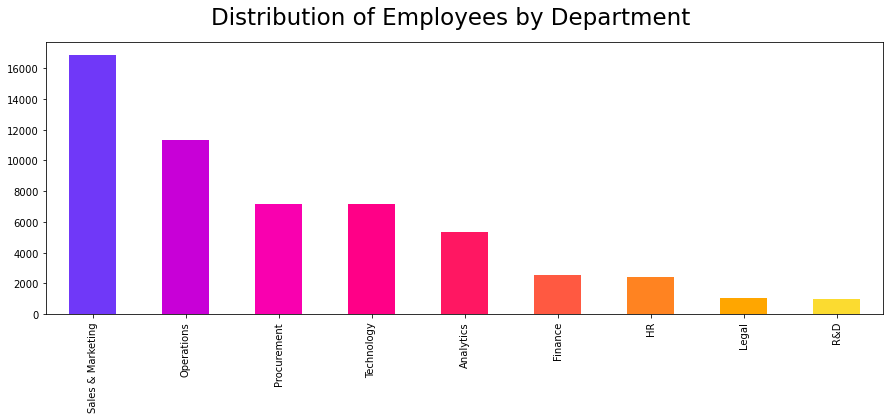

In [13]:
### Proportion of Male Employees Promoted# visualizing the different groups in the dataset
plt.subplots(figsize=(15,5))

#Obtain relative frequencies of the unique values in Department
df_classification['department'].value_counts(normalize = True)

#Create vertical bar plot of unique values in Departmnet
df_classification['department'].value_counts(dropna = False).plot.bar(color=['#7038f8', '#c800d7', '#f900af',
                                                                             '#ff0087', '#ff1762', '#ff5941',
                                                                            '#ff8321', '#ffa600', '#fbdb30'])

#Add a centred suptitle to the figure### Distribution of Employees by Department
plt.suptitle("Distribution of Employees by Department", fontsize = 23)
plt.show()

### Distribution of Employees by Region

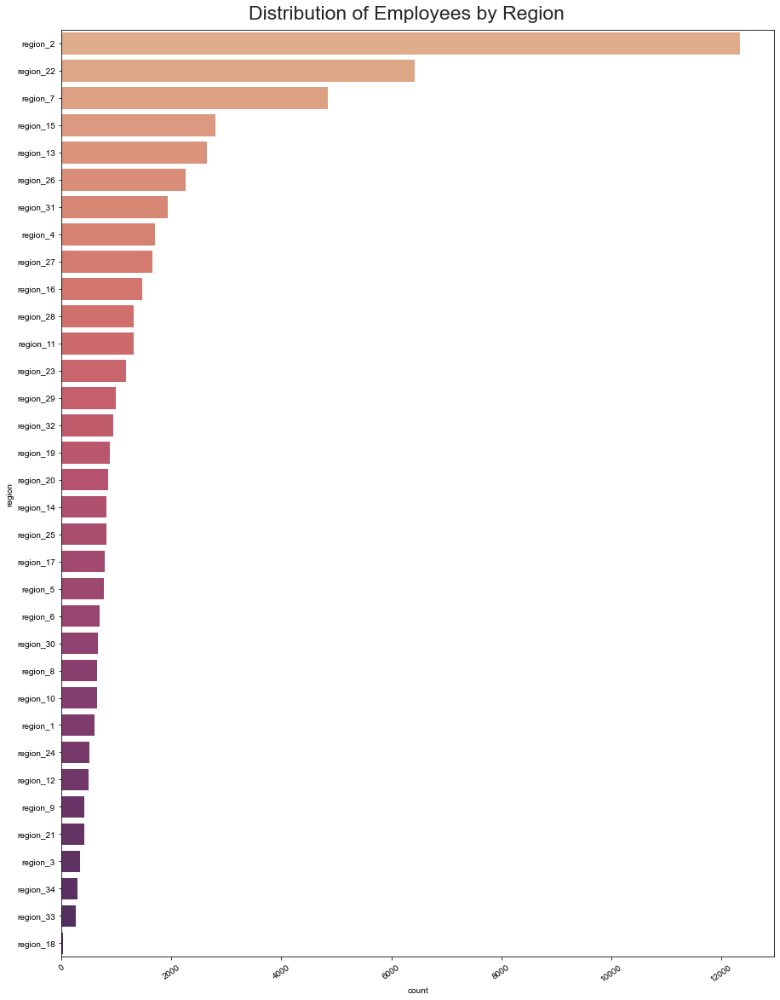

In [14]:
### Distribution of Employees by Region# categorical features - region
plt.figure(figsize=(15,20))

#Show the counts of observations in each categorical bin using bars in Region Column.
ax = sns.countplot(y="region",data=df_classification, 
                    palette="flare", order = df_classification['region'].value_counts().index)

# Set the current tick locations and labels of the x-axis.
plt.xticks(rotation=35)

#Do not show grid lines
ax.grid(False)

#Set aspects of the visual theme for the seaborn plot
sns.set(style="whitegrid")

#Add a centred suptitle to the figure
plt.suptitle("Distribution of Employees by Region", fontsize = 23, y=0.9)
plt.show()

### Effect of previously winning an award in determining Promotion

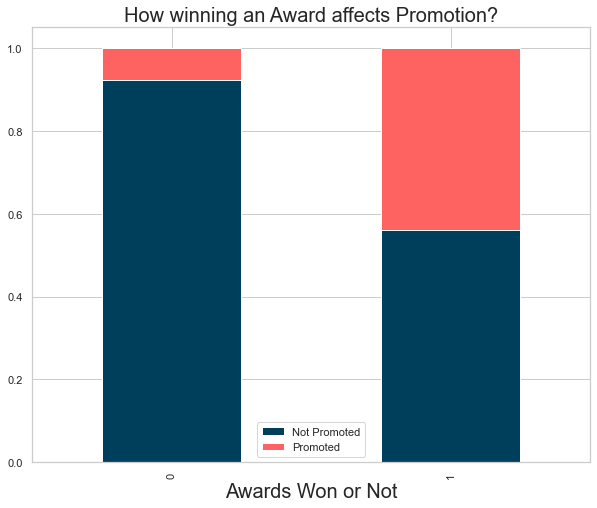

In [15]:
### Effect of previously winning an award in determining Promotion# dependency of awards won on promotion

#Compute a simple cross tabulation of awards won and whether the employee is promoted
data = pd.crosstab(df_classification['awards_won?'], df_classification['is_promoted'])

#Find the floating division of the dataframe and other element-wise and create a vertical stacked bar plot
data.div(data.sum(1).astype('float'), axis = 0).plot(kind = 'bar', stacked = True, figsize = (10, 8), color = ['#003f5c', '#ff6361'])

plt.title('How winning an Award affects Promotion?', fontsize = 20)

#Set the label for the x-axis.
plt.xlabel('Awards Won or Not', fontsize = 20)

# Place a legend (i.e. is_promoted) on the Axes
plt.legend(['Not Promoted', 'Promoted'])
plt.show()

### Effect of meeting KPI > 80% in determining Promotion

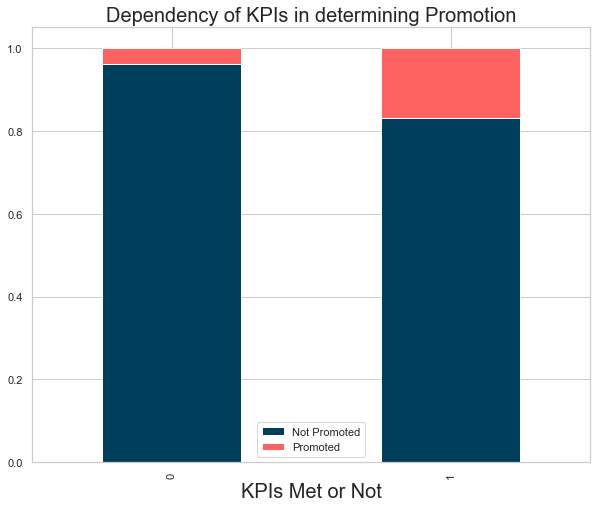

In [16]:
### Effect of meeting KPI > 80% in determining Promotion

#Compute a simple cross tabulation of KPI > 80% and whether the employee is promoted
data = pd.crosstab(df_classification['KPIs_met >80%'], df_classification['is_promoted'])

#Find the floating division of the dataframe and other element-wise and create a vertical stacked bar plot
data.div(data.sum(1).astype('float'),
         axis = 0).plot(kind = 'bar',stacked = True,
                        figsize = (10, 8), color = ['#003f5c', '#ff6361'])


plt.title('Dependency of KPIs in determining Promotion', fontsize = 20)

#Set the label for the x-axis.
plt.xlabel('KPIs Met or Not', fontsize = 20)

# Place a legend (i.e. is_promoted) on the Axes
plt.legend(['Not Promoted', 'Promoted'])
plt.show()

### Effect of Average Training Score on Promotion

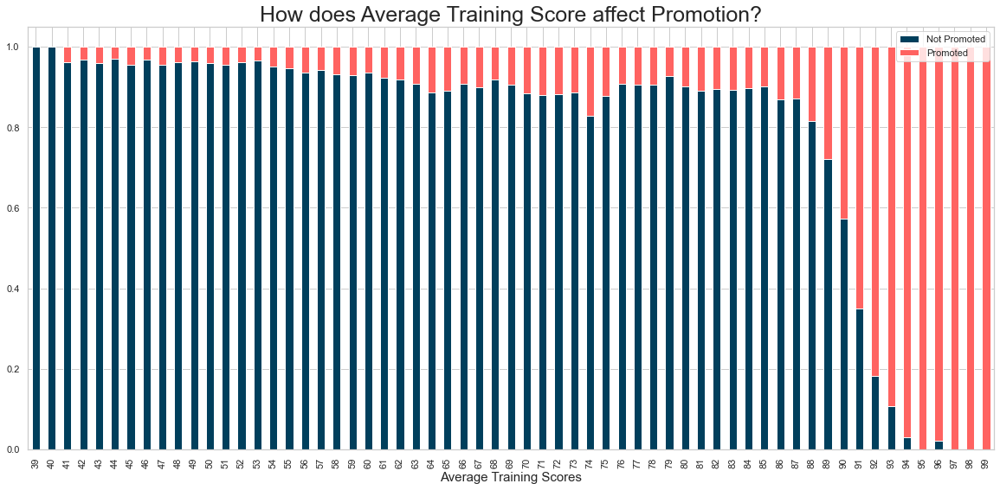

In [17]:
#Compute a simple cross tabulation of Average Training Score and whether the employee is promoted
data = pd.crosstab(df_classification['avg_training_score'], df_classification['is_promoted'])

#Find the floating division of the dataframe and other element-wise and create a vertical stacked bar plot
data.div(data.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (20, 9),
                                                   color = ['#003f5c', '#ff6361'])

plt.title('How does Average Training Score affect Promotion?', fontsize = 25)

#Set the label for the x-axis.
plt.xlabel('Average Training Scores', fontsize = 15)

# Place a legend (i.e. is_promoted) on the Axes
plt.legend(['Not Promoted', 'Promoted'])
plt.show()

### Effect of Previous Year Rating on Promotion

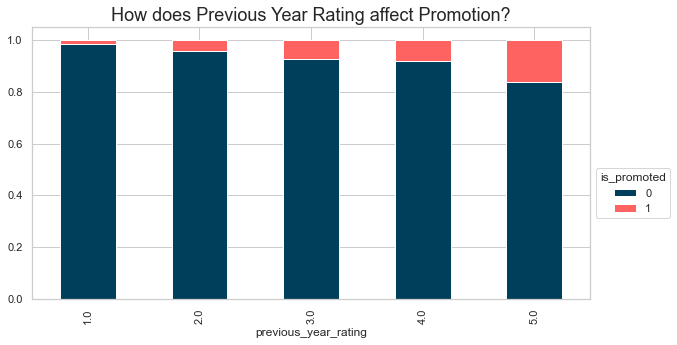

In [18]:
plt.rcParams['figure.figsize'] = [10, 5]

#Compute a simple cross tabulation of Previous Year Rating and whether the employee is promoted
score_bin = pd.crosstab(df_classification.previous_year_rating,df_classification.is_promoted,normalize='index')

#Plot a vertical stacked bar chart with the following colors
score_bin.plot.bar(stacked=True,color = ['#003f5c', '#ff6361'])

# Place a legend (i.e. is_promoted) on the Axes with the respective width and height of the bounding box
plt.legend(title='is_promoted',loc='upper left',bbox_to_anchor=(1, 0.5))

plt.title('How does Previous Year Rating affect Promotion?', fontsize = 18)
plt.show()

### Effect of Length of Service on Promotion

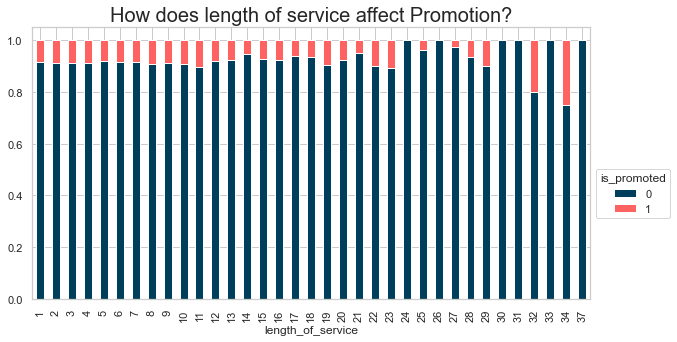

In [19]:
plt.rcParams['figure.figsize'] = [10, 5]

#Compute a simple cross tabulation of length of service and whether the employee is promoted
score_bin = pd.crosstab(df_classification.length_of_service,df_classification.is_promoted,normalize='index')

#Plot a vertical stacked bar chart with the following colors
score_bin.plot.bar(stacked=True,color = ['#003f5c', '#ff6361'])

# Place a legend (i.e. is_promoted) on the Axes with the respective width and height of the bounding box
plt.legend(title='is_promoted',loc='upper left',bbox_to_anchor=(1, 0.5))
plt.title('How does length of service affect Promotion?', fontsize = 20)
plt.show()

### Avg Training Score Distribution across Department and Promotion

In [20]:
#In a box plot, rows of data_frame are grouped together into a box-and-whisker mark to visualize their distribution.
#Boxplot distribution of average training score across department based on whether an employee is promoted or not
px.box(df, x='department', y='avg_training_score',color='is_promoted',notched=True,title='Avg Training Scores by Department and Promotion')

### 1.2 Cleanse and Transform the data

### Step 1 - Verification and Removal of Duplicate records

In [21]:
def remove_duplicate(df_classification):
    #Retrieve the number of rows present before removing the duplicate
    print("BEFORE REMOVING DUPLICATES - No. of Rows = ",df_classification.shape[0])
    
    #Drop any duplicates found after the first presence of a particular record
    df_classification.drop_duplicates(keep="first", inplace=True) 
    
    #Retrieve the number of rows present after removing the duplicate
    print("AFTER REMOVING DUPLICATES  - No. of Rows = ",df_classification.shape[0])
    
    #Validation message
    return "Performed check for duplicate rows"

# Remove Duplicates from "train" data:
remove_duplicate(df_classification)   

BEFORE REMOVING DUPLICATES - No. of Rows =  54808
AFTER REMOVING DUPLICATES  - No. of Rows =  54808


'Performed check for duplicate rows'

### Step 2.1 - Checking for Various Types of Null Values in Dataframe

In [22]:
# To verify that there are no other types of missing values, an easy way is to make a list of missing value types
missing_values = ["n/a", "na", "N.A.", "--"]

#Check for list of na values as listed previously in the hr_data.csv file
df_classification = pd.read_csv('hr_data.csv', na_values = missing_values)

#Return boolean value on whether there is presence of null value in the respective column
df_classification.isnull().any()

employee_id             False
department              False
region                  False
education                True
gender                  False
recruitment_channel     False
no_of_trainings         False
age                     False
previous_year_rating     True
length_of_service       False
KPIs_met >80%           False
awards_won?             False
avg_training_score      False
is_promoted             False
dtype: bool

### Step 2.2 - Number of Null Values in Dataframe

In [23]:
print("Number of null values across columns: ")
#print the number of null values present for each column
display(df_classification.isnull().sum())

# Missing Values are present in previous_year_rating and education columns in both Train and Test Data 

Number of null values across columns: 


employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

### Step 2.3 - Proportion of Null Values in Dataframe

In [24]:
#Obtain the percentage of missing values by taking the sum of missing value for each column divided by the total number of records present
(df_classification.isnull().sum()/df_classification.shape[0])*100

employee_id             0.000000
department              0.000000
region                  0.000000
education               4.395344
gender                  0.000000
recruitment_channel     0.000000
no_of_trainings         0.000000
age                     0.000000
previous_year_rating    7.524449
length_of_service       0.000000
KPIs_met >80%           0.000000
awards_won?             0.000000
avg_training_score      0.000000
is_promoted             0.000000
dtype: float64

### Step 3.1 - Comparing Null Values in Previous Year Rating with Values in Length Of Service Column

In [25]:
#Create a variable to store records in the dataframe with null values in previous_year_rating
df_null_previous_year_rating = df_classification.loc[df["previous_year_rating"].isnull()]

#View previous_year_rating column alongside length_of_service to observe any relationship
df_null_previous_year_rating[['previous_year_rating', 'length_of_service']]

,previous_year_rating,length_of_service
10,NaN,1
23,NaN,1
29,NaN,1
56,NaN,1
58,NaN,1
...,...,...
54703,NaN,1
54734,NaN,1
54746,NaN,1
54773,NaN,1


### Step 3.2 - Unique Values in Length Of Service Column based off Previous Year Rating column with Null Values

In [26]:
#Unique values in length_of_service for columns that has null value as previous_year_rating
df_null_previous_year_rating['length_of_service'].unique()

array([1], dtype=int64)

### Step 3.3 - Unique Values in Previous Year Rating

In [27]:
#Check for all the unique values present in previous_year_rating
df_classification['previous_year_rating'].unique()

array([ 5.,  3.,  1.,  4., nan,  2.])

### Step 3.4 - Filling Null Values in Previous Year Rating with 0

In [28]:
# Why is Data Missing in Column "previous_year_rating" ? 
# 1. Data was not entered Because those employees were Freshers (i.e) length_of_service = 1 
# 2. No Data would have been there in the Data Source itself for these employees.
# Logically we are imputing with "0" as Freshers with 1 Year Experince may not have previous_year_rating at all!

# Filling Missing Values in Train and Test :
#Fill missing values in previous_year_rating with 0
df_classification["previous_year_rating"] = df_classification["previous_year_rating"].fillna(0)

### Step 3.5 - Unique Values in Previous Year Rating after Imputation

In [29]:
#Check for all the unique values present in previous_year_rating
df_classification['previous_year_rating'].unique()

array([5., 3., 1., 4., 0., 2.])

### Step 3.6 Verifying Number of Null Values

In [30]:
#Confirm that there are not more null values in previous_year_rating
# and Check the remaining number of null values in other columns
print("Number of null values across columns: ")
display(df_classification.isnull().sum())

Number of null values across columns: 


employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating       0
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

### Step 4.1 - Checking Number of Unique Values in Education

In [31]:
#Obtain the frequency of each unique value in education column
df_classification['education'].value_counts()

Bachelor's          36669
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

### Step 4.2 - Obtain Mode of Education Column

In [32]:
#Obtain the mode value of the education column
df_classification['education'].mode()

0    Bachelor's
dtype: object

### Step 4.3 - Impute Mode into Null Values of Education Column

In [33]:
#Fill null values in education column with the mode value obtained
df_classification['education'].fillna(df_classification['education'].mode()[0], inplace = True)

#Confirm that there are not more null values in education
print("Number of null values across columns: ")
display(df_classification.isnull().sum())

Number of null values across columns: 


employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
is_promoted             0
dtype: int64

### Step 4.4 - View Change in Number of Bachelor's in Education

In [34]:
#Obtain the frequency of each unique value in education column after mode imputation
df_classification['education'].value_counts()

Bachelor's          39078
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

### Step 5.1 - Identifying Object Datatypes to Perform Ordinal Encoding

In [35]:
#Check the datatype of each column in the dataframe
df_classification.dtypes

employee_id               int64
department               object
region                   object
education                object
gender                   object
recruitment_channel      object
no_of_trainings           int64
age                       int64
previous_year_rating    float64
length_of_service         int64
KPIs_met >80%             int64
awards_won?               int64
avg_training_score        int64
is_promoted               int64
dtype: object

### Step 5.2 - Identifying Unique Values to Map in Department

In [36]:
#Check for the unique values present in department column
df_classification['department'].unique()

array(['Sales & Marketing', 'Operations', 'Technology', 'Analytics',
       'R&D', 'Procurement', 'Finance', 'HR', 'Legal'], dtype=object)

### Step 5.3 - Perform Ordinal Encoding on Department

In [37]:
# Actual Unique Values in department Column are : ['Analytics' 'Finance' 'HR' 'Legal' 'Operations' 'Procurement' 'R&D'
#'Sales & Marketing' 'Technology']

#Create Mapping for the department values from 0 to the length-1 of unique values
department_mapping = {'Analytics':0, 'Finance':1, 'HR':2,'Legal':3, 'Operations':4, 
                      'Procurement':5, 'R&D':6,'Sales & Marketing':7, 'Technology':8}

#Perform mapping/encoding of each unique value in department as an integer
df_classification['department'] = df_classification['department'].map(department_mapping).astype(int)
df_classification.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,7,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,4,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,7,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,7,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,8,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


### Step 5.4 - Verify unique values after Encoding

In [38]:
#Check the unique values in department column
df_classification['department'].unique()

array([7, 4, 8, 0, 6, 5, 1, 2, 3])

### Step 5.5 - Identifying Unique Values to Map in Education

In [39]:
#Check for the unique values present in education column
df_classification['education'].unique()

array(["Master's & above", "Bachelor's", 'Below Secondary'], dtype=object)

### Step 5.6 - Perform Ordinal Encoding on Education

In [40]:
#Create Mapping for the education values from 0 to the length-1 of unique values
education_mapping = {'Below Secondary':0, "Bachelor's":1, "Master's & above":2}

#Perform mapping/encoding of each unique value in education as an integer
df_classification['education'] = df_classification['education'].map(education_mapping).astype(int)
df_classification.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,7,region_7,2,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,4,region_22,1,m,other,1,30,5.0,4,0,0,60,0
2,7513,7,region_19,1,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,7,region_23,1,m,other,2,39,1.0,10,0,0,50,0
4,48945,8,region_26,1,m,other,1,45,3.0,2,0,0,73,0


### Step 5.7 - Verify unique values after Encoding

In [41]:
#Check the unique values in education column
df_classification['education'].unique()

array([2, 1, 0])

### Step 5.8 - Identifying Unique Values to Map in Gender

In [42]:
#Check for the unique values present in gender column
df_classification['gender'].unique()

array(['f', 'm'], dtype=object)

### Step 5.9 - Perform Ordinal Encoding on Gender

In [43]:
#Create Mapping for the gender values from 0 to the length-1 of unique values
gender_mapping = {"f":0, "m":1}

#Perform mapping/encoding of each unique value in gender as an integer
df_classification['gender'] = df_classification['gender'].map(gender_mapping).astype(int)
df_classification.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,7,region_7,2,0,sourcing,1,35,5.0,8,1,0,49,0
1,65141,4,region_22,1,1,other,1,30,5.0,4,0,0,60,0
2,7513,7,region_19,1,1,sourcing,1,34,3.0,7,0,0,50,0
3,2542,7,region_23,1,1,other,2,39,1.0,10,0,0,50,0
4,48945,8,region_26,1,1,other,1,45,3.0,2,0,0,73,0


### Step 5.10 - Verify unique values after Encoding

In [44]:
#Check the unique values in gender column
df_classification['gender'].unique()

array([0, 1])

### Step 5.11 -  Identifying Unique Values to Map in Recruitment Channel

In [45]:
#Check for the unique values present in recruitment channel column
df_classification['recruitment_channel'].unique()

array(['sourcing', 'other', 'referred'], dtype=object)

### Step 5.12 - Perform Ordinal Encoding on Recruitment Channel

In [46]:
#Create Mapping for the recruitment channel values from 0 to the length-1 of unique values
recruitment_channel_mapping = {'sourcing':0, 'other':1, 'referred':2}

#Perform mapping/encoding of each unique value in recruitment channel column  as an integer
df_classification['recruitment_channel'] = df_classification['recruitment_channel'].map(recruitment_channel_mapping).astype(int)
df_classification.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,7,region_7,2,0,0,1,35,5.0,8,1,0,49,0
1,65141,4,region_22,1,1,1,1,30,5.0,4,0,0,60,0
2,7513,7,region_19,1,1,0,1,34,3.0,7,0,0,50,0
3,2542,7,region_23,1,1,1,2,39,1.0,10,0,0,50,0
4,48945,8,region_26,1,1,1,1,45,3.0,2,0,0,73,0


### Step 5.13 - Verify unique values after Encoding

In [47]:
#Check the unique values in recruitment_channel column
df_classification['recruitment_channel'].unique()

array([0, 1, 2])

### Step 6.1 - Identify Unique Values in Region

In [48]:
#Check for the unique values present in region column
df_classification['region'].unique()

array(['region_7', 'region_22', 'region_19', 'region_23', 'region_26',
       'region_2', 'region_20', 'region_34', 'region_1', 'region_4',
       'region_29', 'region_31', 'region_15', 'region_14', 'region_11',
       'region_5', 'region_28', 'region_17', 'region_13', 'region_16',
       'region_25', 'region_10', 'region_27', 'region_30', 'region_12',
       'region_21', 'region_8', 'region_32', 'region_6', 'region_33',
       'region_24', 'region_3', 'region_9', 'region_18'], dtype=object)

### Step 6.2 - Extract Redundant String and Convert Region Column to Integer

In [49]:
#Extract 'region_' string out of each value in region
df_classification = df_classification.assign(region = lambda x: x['region'].str.extract('(\d+)'))

#Convert to an integer datatype for the region column
df_classification['region'] = df_classification['region'].apply(pd.to_numeric)
df_classification.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,7,7,2,0,0,1,35,5.0,8,1,0,49,0
1,65141,4,22,1,1,1,1,30,5.0,4,0,0,60,0
2,7513,7,19,1,1,0,1,34,3.0,7,0,0,50,0
3,2542,7,23,1,1,1,2,39,1.0,10,0,0,50,0
4,48945,8,26,1,1,1,1,45,3.0,2,0,0,73,0


### Step 6.3 - Verify Unique Values in Region

In [50]:
#Check the unique values in recruitment_channel column
df_classification['region'].unique()

array([ 7, 22, 19, 23, 26,  2, 20, 34,  1,  4, 29, 31, 15, 14, 11,  5, 28,
       17, 13, 16, 25, 10, 27, 30, 12, 21,  8, 32,  6, 33, 24,  3,  9, 18],
      dtype=int64)

### Step 7.1 View Distribution and Data Skewness of Age across Employees

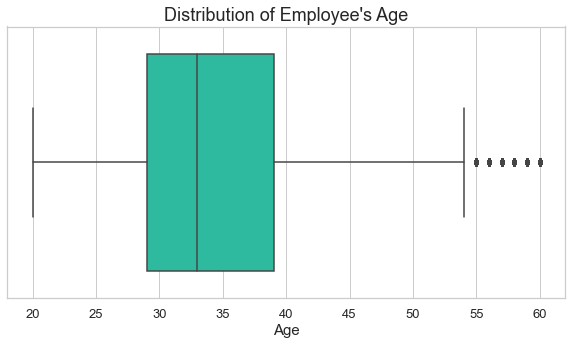

In [51]:
#Create a boxplot illustrating the distribution of age
sns.boxplot(x = df_classification["age"], color = '#15D2AD')

#set title of seaborn boxplot
plt.title("Distribution of Employee's Age", fontsize=18)

#Set the X axis title label to 'Age'
plt.xlabel('Age', fontsize=15)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

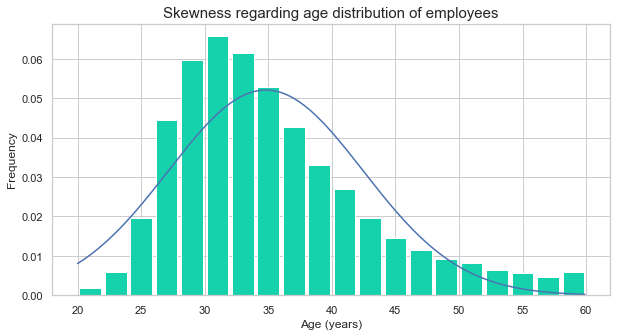

In [52]:
#Create a histogram illustrating the age distribution with a total of 20 bins
plt.hist(df_classification.age, bins = 20, rwidth = 0.85, density = True, color = '#15D2AD')

#set x label and ylabel to age and frequency respectively
plt.xlabel('Age (years)')
plt.ylabel('Frequency')

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_classification.age.min(), df_classification.age.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_classification.age.mean(), df_classification.age.std()))
plt.title("Skewness regarding age distribution of employees", fontsize=15)
plt.show()

### Step 7.2 Perform Log Transformation on Age

In [53]:
#Perform log transformation on the age column 
df_classification['age'] = np.log1p(df_classification['age'])

# Display Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values
df_classification.describe()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,4.972796,14.195045,1.257627,0.702379,0.597176,1.253011,3.556936,3.078748,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,2.506046,10.086273,0.469717,0.457216,0.531258,0.609264,0.202229,1.496458,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,3.044522,0.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,4.000000,4.000000,1.000000,0.000000,0.000000,1.000000,3.401197,2.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,5.000000,13.000000,1.000000,1.000000,1.000000,1.000000,3.526361,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,7.000000,22.000000,2.000000,1.000000,1.000000,1.000000,3.688879,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,8.000000,34.000000,2.000000,1.000000,2.000000,10.000000,4.110874,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


### Step 7.3 Changes after performing Log Transformation on Age

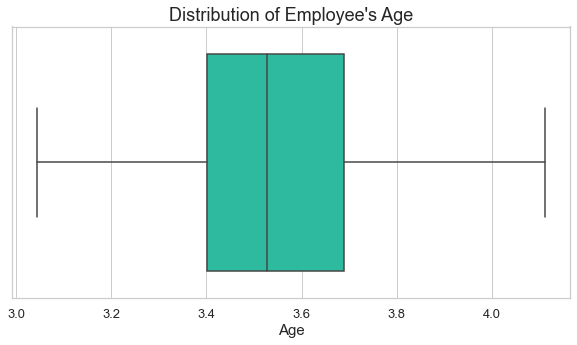

In [54]:
#Create a boxplot illustrating the distribution of age
sns.boxplot(x = df_classification["age"], color = '#15D2AD')

#set title of seaborn boxplot
plt.title("Distribution of Employee's Age", fontsize=18)

#Set the X axis title label to 'Age'
plt.xlabel('Age', fontsize=15)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

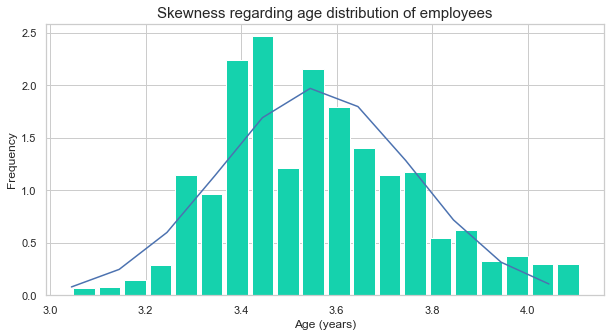

In [55]:
#Create a histogram illustrating the age distribution with a total of 20 bins
plt.hist(df_classification.age, bins = 20, rwidth = 0.85, density = True, color = '#15D2AD')

#set x label and ylabel to age and frequency respectively
plt.xlabel('Age (years)')
plt.ylabel('Frequency')

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_classification.age.min(), df_classification.age.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_classification.age.mean(), df_classification.age.std()))
plt.title("Skewness regarding age distribution of employees", fontsize=15)
plt.show()

### Step 8.1 View Distribution and Data Skewness of Length of Service

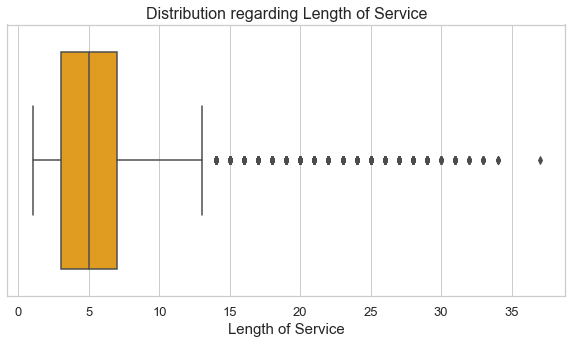

In [56]:
#Create a boxplot illustrating the distribution of length_of_service
sns.boxplot(x = df_classification["length_of_service"], color = '#ffa600')

#set title of seaborn boxplot
plt.title("Distribution regarding Length of Service", fontsize=16)

#Set the X axis title label to 'Length of Service'
plt.xlabel('Length of Service', fontsize=15)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

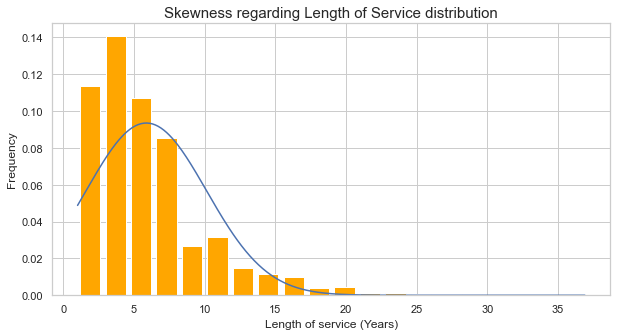

In [57]:
#Create a histogram illustrating the length of service distribution with a total of 20 bins
plt.hist(df_classification.length_of_service, bins = 20, rwidth = 0.8, density = True, color = '#ffa600')

#set x label and ylabel to length of service and frequency respectively
plt.xlabel('Length of service (Years)')
plt.ylabel('Frequency')

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_classification.length_of_service.min(), df_classification.length_of_service.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_classification.length_of_service.mean(), df_classification.length_of_service.std()))
plt.title("Skewness regarding Length of Service distribution", fontsize=15)
plt.show()

### Step 8.2 Perform Log Transformation on Length of Service

In [58]:
#Perform log transformation on the length of service column 
df_classification['length_of_service'] = np.log1p(df_classification['length_of_service'])

# Display Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values
df_classification.describe()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,4.972796,14.195045,1.257627,0.702379,0.597176,1.253011,3.556936,3.078748,1.758301,0.351974,0.023172,63.386750,0.085170
std,22586.581449,2.506046,10.086273,0.469717,0.457216,0.531258,0.609264,0.202229,1.496458,0.579772,0.477590,0.150450,13.371559,0.279137
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,3.044522,0.000000,0.693147,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,4.000000,4.000000,1.000000,0.000000,0.000000,1.000000,3.401197,2.000000,1.386294,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,5.000000,13.000000,1.000000,1.000000,1.000000,1.000000,3.526361,3.000000,1.791759,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,7.000000,22.000000,2.000000,1.000000,1.000000,1.000000,3.688879,4.000000,2.079442,1.000000,0.000000,76.000000,0.000000
max,78298.000000,8.000000,34.000000,2.000000,1.000000,2.000000,10.000000,4.110874,5.000000,3.637586,1.000000,1.000000,99.000000,1.000000


### Step 8.3 Changes after performing Log Transformation on Length of Service

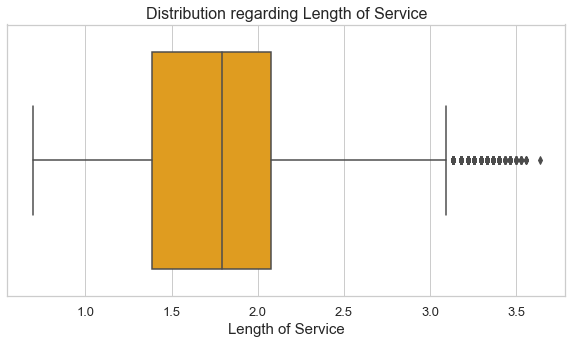

In [59]:
#Create a boxplot illustrating the distribution of length_of_service
sns.boxplot(x = df_classification["length_of_service"], color = '#ffa600')

#set title of seaborn boxplot
plt.title("Distribution regarding Length of Service", fontsize=16)

#Set the X axis title label to 'Length of Service'
plt.xlabel('Length of Service', fontsize=15)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

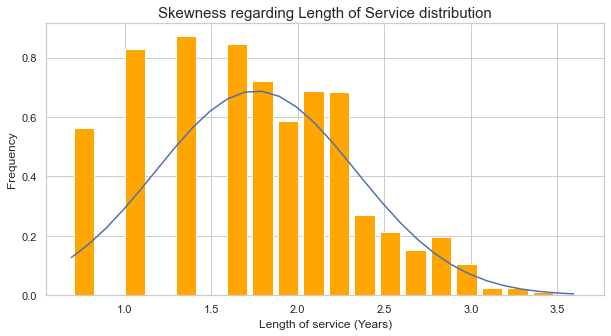

In [60]:
#Create a histogram illustrating the length of service distribution with a total of 20 bins
plt.hist(df_classification.length_of_service, bins = 20, rwidth = 0.8, density = True, color = '#ffa600')


#set x label and ylabel to length of service and frequency respectively
plt.xlabel('Length of service (Years)')
plt.ylabel('Frequency')

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_classification.length_of_service.min(), df_classification.length_of_service.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_classification.length_of_service.mean(), df_classification.length_of_service.std()))
plt.title("Skewness regarding Length of Service distribution", fontsize=15)
plt.show()

### Step 9.1 View Distribution and Data Skewness of Average Training Score

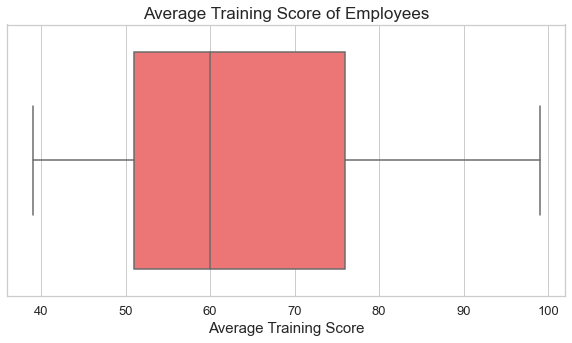

In [61]:
#Create a boxplot illustrating the distribution of average training score
sns.boxplot(x = df_classification["avg_training_score"], color = '#ff6361')

#set title of seaborn boxplot
plt.title("Average Training Score of Employees", fontsize=17)

#Set the X axis title label to 'Average Training Score'
plt.xlabel('Average Training Score', fontsize=15)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

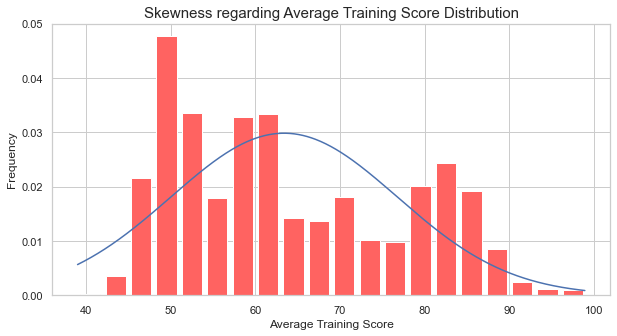

In [62]:
#Create a histogram illustrating the average training score distribution with a total of 20 bins
plt.hist(df_classification.avg_training_score, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to average training score and frequency respectively
plt.xlabel('Average Training Score')
plt.ylabel('Frequency')

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_classification.avg_training_score.min(), df_classification.avg_training_score.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_classification.avg_training_score.mean(), df_classification.avg_training_score.std()))
plt.title("Skewness regarding Average Training Score Distribution", fontsize=15)
plt.show()

### Step 9.2 Perform Log Transformation on avg_training_score

In [63]:
#Perform log transformation on the length of service column 
df_classification["avg_training_score"] = np.log1p(df_classification["avg_training_score"]) 

# Display Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values
df_classification.describe()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,4.972796,14.195045,1.257627,0.702379,0.597176,1.253011,3.556936,3.078748,1.758301,0.351974,0.023172,4.143877,0.085170
std,22586.581449,2.506046,10.086273,0.469717,0.457216,0.531258,0.609264,0.202229,1.496458,0.579772,0.477590,0.150450,0.203970,0.279137
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,3.044522,0.000000,0.693147,0.000000,0.000000,3.688879,0.000000
25%,19669.750000,4.000000,4.000000,1.000000,0.000000,0.000000,1.000000,3.401197,2.000000,1.386294,0.000000,0.000000,3.951244,0.000000
50%,39225.500000,5.000000,13.000000,1.000000,1.000000,1.000000,1.000000,3.526361,3.000000,1.791759,0.000000,0.000000,4.110874,0.000000
75%,58730.500000,7.000000,22.000000,2.000000,1.000000,1.000000,1.000000,3.688879,4.000000,2.079442,1.000000,0.000000,4.343805,0.000000
max,78298.000000,8.000000,34.000000,2.000000,1.000000,2.000000,10.000000,4.110874,5.000000,3.637586,1.000000,1.000000,4.605170,1.000000


### Step 9.3 Changes after performing Log Transformation on avg_training_score

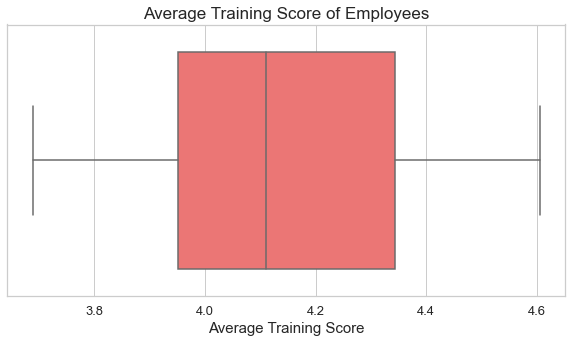

In [64]:
#Create a boxplot illustrating the distribution of average training score
sns.boxplot(x = df_classification["avg_training_score"], color = '#ff6361')

#set title of seaborn boxplot
plt.title("Average Training Score of Employees", fontsize=17)

#Set the X axis title label to 'Average Training Score'
plt.xlabel('Average Training Score', fontsize=15)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

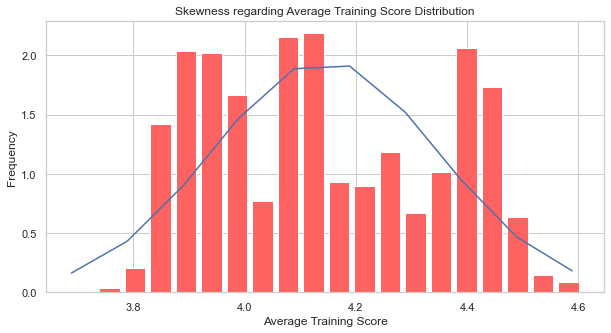

In [65]:
#Create a histogram illustrating the average training score distribution with a total of 20 bins
plt.hist(df_classification.avg_training_score, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to average training score and frequency respectively
plt.xlabel('Average Training Score')
plt.ylabel('Frequency')

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_classification.avg_training_score.min(), df_classification.avg_training_score.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_classification.avg_training_score.mean(), df_classification.avg_training_score.std()))
plt.title("Skewness regarding Average Training Score Distribution", fontsize=12)
plt.show()

### Step 10.1 Check for Imbalanced Target Variable

In [66]:
#Count the frequency of occurrence regarding employees promoted and not promoted
df_classification['is_promoted'].value_counts()

0    50140
1     4668
Name: is_promoted, dtype: int64

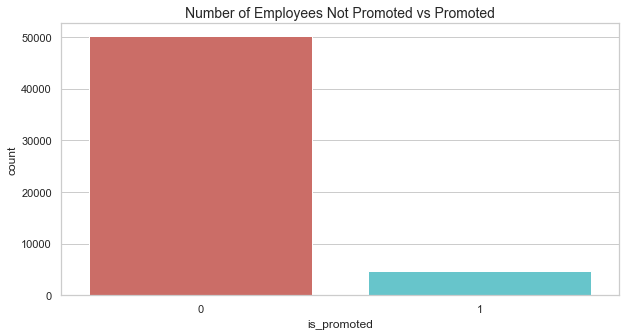

In [67]:
#Plot a count plot to visualize the number of employees promoted and not promoted
sns.countplot(data= df_classification, x = "is_promoted", palette = "hls")
plt.title("Number of Employees Not Promoted vs Promoted", fontsize=14)
plt.show()

### Step 10.2 Create Dataframe of Records with Employees Promoted

In [68]:
#Create a dataframe that stores only records whereby the employee has been promoted
df1 = df_classification[df_classification['is_promoted']==1]
df1.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
11,49017,7,7,1,0,0,1,3.583519,5.0,1.386294,1,0,3.931826,1
39,58304,7,28,1,1,0,1,3.526361,5.0,1.945910,1,0,3.951244,1
60,17673,7,4,2,1,1,1,3.931826,4.0,2.890372,1,0,3.871201,1
66,77981,1,22,1,1,1,1,3.332205,0.0,0.693147,1,1,4.077537,1
67,16502,7,22,1,1,0,1,3.332205,0.0,0.693147,0,0,4.127134,1


In [69]:
#Check length/number of records of df1 dataframe
len(df1)

4668

### Step 10.3 Create Dataframe of Records with Employees Not Promoted

In [70]:
#Create a dataframe that stores only records whereby the employee has not been promoted
df0 = df_classification[df_classification['is_promoted']==0]
df0.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,7,7,2,0,0,1,3.583519,5.0,2.197225,1,0,3.912023,0
1,65141,4,22,1,1,1,1,3.433987,5.0,1.609438,0,0,4.110874,0
2,7513,7,19,1,1,0,1,3.555348,3.0,2.079442,0,0,3.931826,0
3,2542,7,23,1,1,1,2,3.688879,1.0,2.397895,0,0,3.931826,0
4,48945,8,26,1,1,1,1,3.828641,3.0,1.098612,0,0,4.304065,0


### Step 10.4 Ensure Records of Employees Promoted and Not Promoted are Equal

In [71]:
#Create a dataframe that removes the surplus of records observed in df0 compared to make it equivalent to the number of records in df1
df0_sampled = df0.sample(n=len(df1),random_state = 2).copy()
df0_sampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4668 entries, 6725 to 12976
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           4668 non-null   int64  
 1   department            4668 non-null   int32  
 2   region                4668 non-null   int64  
 3   education             4668 non-null   int32  
 4   gender                4668 non-null   int32  
 5   recruitment_channel   4668 non-null   int32  
 6   no_of_trainings       4668 non-null   int64  
 7   age                   4668 non-null   float64
 8   previous_year_rating  4668 non-null   float64
 9   length_of_service     4668 non-null   float64
 10  KPIs_met >80%         4668 non-null   int64  
 11  awards_won?           4668 non-null   int64  
 12  avg_training_score    4668 non-null   float64
 13  is_promoted           4668 non-null   int64  
dtypes: float64(4), int32(4), int64(6)
memory usage: 474.1 KB


In [72]:
#Create a dataframe that concatenates df0_sampled (not promoted) and df1(promoted employees)
df_new = pd.concat([df1, df0_sampled], axis=0)
df_new['is_promoted'].value_counts()

0    4668
1    4668
Name: is_promoted, dtype: int64

In [73]:
#prints information about the balanced target variable DataFrame including the index dtype and columns, non-null values and memory usage.
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9336 entries, 11 to 12976
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           9336 non-null   int64  
 1   department            9336 non-null   int32  
 2   region                9336 non-null   int64  
 3   education             9336 non-null   int32  
 4   gender                9336 non-null   int32  
 5   recruitment_channel   9336 non-null   int32  
 6   no_of_trainings       9336 non-null   int64  
 7   age                   9336 non-null   float64
 8   previous_year_rating  9336 non-null   float64
 9   length_of_service     9336 non-null   float64
 10  KPIs_met >80%         9336 non-null   int64  
 11  awards_won?           9336 non-null   int64  
 12  avg_training_score    9336 non-null   float64
 13  is_promoted           9336 non-null   int64  
dtypes: float64(4), int32(4), int64(6)
memory usage: 948.2 KB


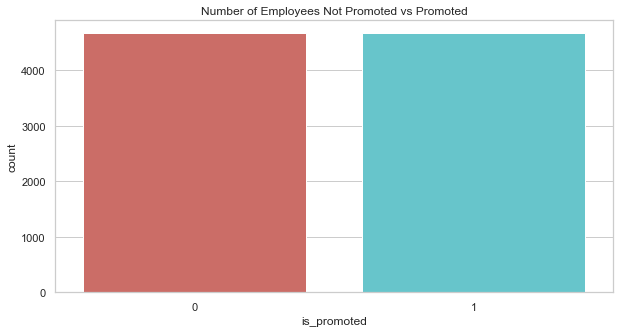

In [74]:
#Plot a countplot to visualize the number of employees that were promoted and not promoted to ensure they are balanced
sns.countplot(data= df_new, x = "is_promoted", palette = "hls")
plt.title("Number of Employees Not Promoted vs Promoted")
plt.show()

In [75]:
df_new.describe()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000,9336.000000
mean,38869.959940,4.941195,14.053985,1.276885,0.695587,0.602506,1.228685,3.552112,3.354220,1.745626,0.508569,0.066945,4.198042,0.500000
std,22642.619782,2.535759,9.901436,0.479382,0.460183,0.538591,0.567723,0.197385,1.507474,0.575429,0.499953,0.249940,0.215049,0.500027
min,15.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,3.044522,0.000000,0.693147,0.000000,0.000000,3.737670,0.000000
25%,19135.500000,4.000000,4.000000,1.000000,0.000000,0.000000,1.000000,3.401197,3.000000,1.386294,0.000000,0.000000,4.007333,0.000000
50%,38955.500000,5.000000,13.000000,1.000000,1.000000,1.000000,1.000000,3.526361,3.000000,1.791759,1.000000,0.000000,4.189655,0.500000
75%,58222.750000,7.000000,22.000000,2.000000,1.000000,1.000000,1.000000,3.663562,5.000000,2.079442,1.000000,0.000000,4.406719,1.000000
max,78292.000000,8.000000,34.000000,2.000000,1.000000,2.000000,7.000000,4.110874,5.000000,3.555348,1.000000,1.000000,4.605170,1.000000


### Step 11.1 Drop Employee ID Feature

In [76]:
#Drop Employee ID column as it is not required in determining promotion
df_new = df_new.drop(['employee_id'], axis = 1)
df_new.head()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
11,7,7,1,0,0,1,3.583519,5.0,1.386294,1,0,3.931826,1
39,7,28,1,1,0,1,3.526361,5.0,1.945910,1,0,3.951244,1
60,7,4,2,1,1,1,3.931826,4.0,2.890372,1,0,3.871201,1
66,1,22,1,1,1,1,3.332205,0.0,0.693147,1,1,4.077537,1
67,7,22,1,1,0,1,3.332205,0.0,0.693147,0,0,4.127134,1


### Step 11.2 Verify removal of Employee ID

In [77]:
#prints information about the DataFrame including the index dtype and columns, non-null values and memory usage.
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9336 entries, 11 to 12976
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   department            9336 non-null   int32  
 1   region                9336 non-null   int64  
 2   education             9336 non-null   int32  
 3   gender                9336 non-null   int32  
 4   recruitment_channel   9336 non-null   int32  
 5   no_of_trainings       9336 non-null   int64  
 6   age                   9336 non-null   float64
 7   previous_year_rating  9336 non-null   float64
 8   length_of_service     9336 non-null   float64
 9   KPIs_met >80%         9336 non-null   int64  
 10  awards_won?           9336 non-null   int64  
 11  avg_training_score    9336 non-null   float64
 12  is_promoted           9336 non-null   int64  
dtypes: float64(4), int32(4), int64(5)
memory usage: 1.1 MB


### 1.3 Correlation Analysis

### Pairwise Correlation of Columns

In [78]:
# This method shows the correlations between the various variables
df_new.corr()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
department,1.000000,-0.103368,0.037101,-0.021952,0.019199,-0.021315,0.077786,-0.057240,0.054660,-0.028628,-0.003422,-0.204932,0.012884
region,-0.103368,1.000000,-0.082501,0.091089,-0.003649,0.022692,-0.237364,-0.048957,-0.140199,-0.013186,-0.006006,0.038536,-0.022502
education,0.037101,-0.082501,1.000000,-0.038892,0.005195,-0.033910,0.452218,0.150214,0.319978,0.017141,0.020516,0.031187,0.049829
gender,-0.021952,0.091089,-0.038892,1.000000,-0.013691,0.077464,-0.033522,-0.027534,-0.030418,-0.026376,0.006760,-0.034236,-0.021415
recruitment_channel,0.019199,-0.003649,0.005195,-0.013691,1.000000,0.011438,0.001606,0.003498,-0.003684,0.000915,-0.002838,0.012989,0.007757
no_of_trainings,-0.021315,0.022692,-0.033910,0.077464,0.011438,1.000000,-0.074564,-0.056734,-0.045647,-0.034267,-0.020329,0.041601,-0.044717
age,0.077786,-0.237364,0.452218,-0.033522,0.001606,-0.074564,1.000000,0.214934,0.646271,-0.020937,0.001233,-0.051264,-0.022955
previous_year_rating,-0.057240,-0.048957,0.150214,-0.027534,0.003498,-0.056734,0.214934,1.000000,0.330678,0.220051,0.051066,0.097188,0.227172
length_of_service,0.054660,-0.140199,0.319978,-0.030418,-0.003684,-0.045647,0.646271,0.330678,1.000000,-0.034608,-0.044720,-0.031113,-0.000270
KPIs_met >80%,-0.028628,-0.013186,0.017141,-0.026376,0.000915,-0.034267,-0.020937,0.220051,-0.034608,1.000000,0.038701,0.030333,0.380519


### Pairwise Pearson Correlation Heatmap

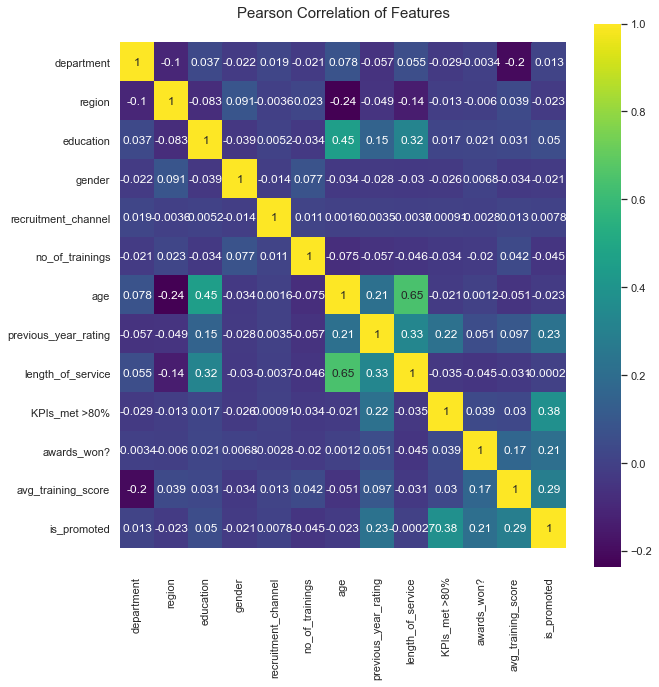

In [79]:
#utilise matplotlib's built-in colormap
colormap = plt.cm.viridis
plt.figure(figsize = (10,10))
plt.title('Pearson Correlation of Features', size = 15)

#Plot a rectangular dataframe as a color-encoded matrix.
ax = sns.heatmap(df_new.astype(float).corr(), cmap = colormap, annot = True)

#Returns the y-axis view limits.
bottom, top = ax.get_ylim()

# Set the y-axis view limits.
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

### Scatter Matrix of Columns

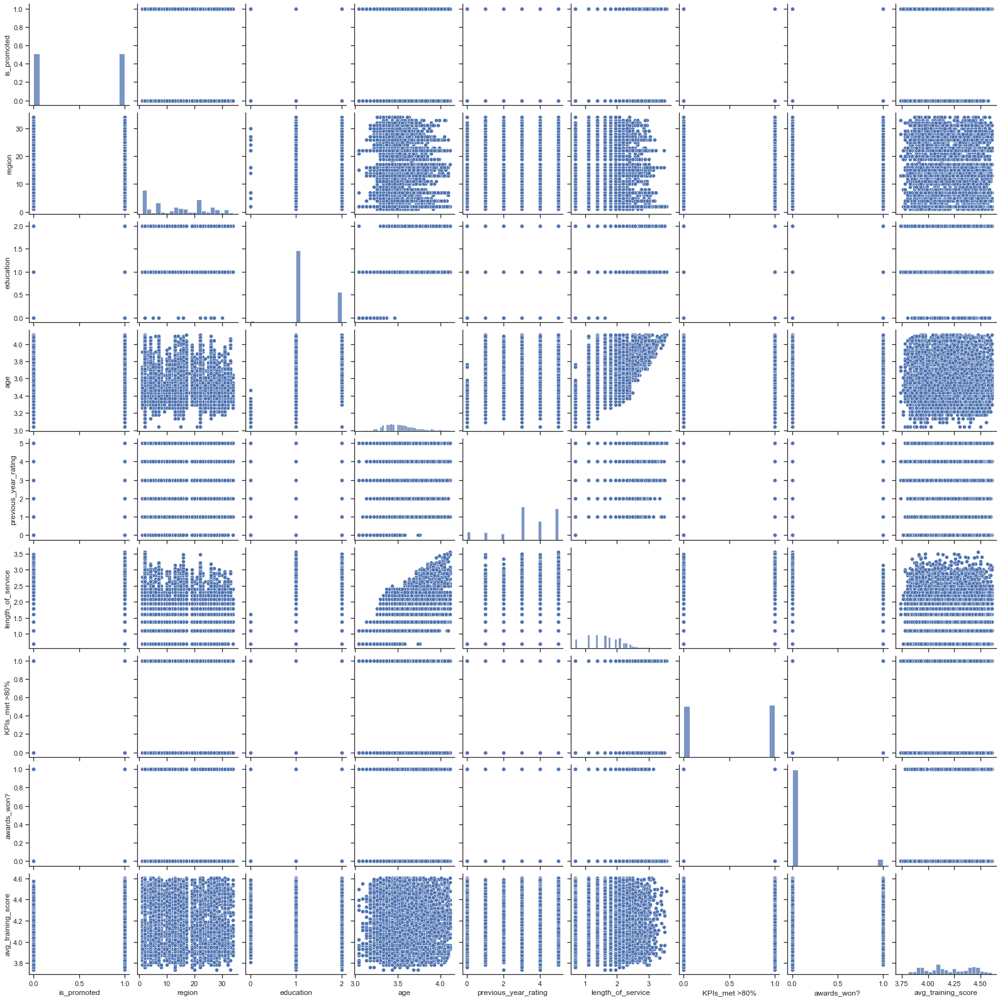

In [80]:
#scatter matrix
sns.set(style="ticks")
#Plot pairwise relationships in a dataset for is_promoted, region, education, age, previous_year_rating, length_of_service,
#KPIs_met >80%, awards_won?, avg_training_score
sns.pairplot(df_new[['is_promoted', 'region', 'education', 'age', 'previous_year_rating', 'length_of_service', 'KPIs_met >80%', 'awards_won?', 'avg_training_score']])
plt.show()

### 1.4 Export the data

In [81]:
#Write object to a comma-separated values (csv) file.
df_new.to_csv('hr_data_new.csv', index = False)

## 2. Airbnb (Regression Problem)

### 2.1 Load and Explore the data

### First 5 Rows of Dataframe

In [82]:
#Read hr_data.csv file into dataframe, df_classification
df = pd.read_csv('listings.csv')
df_regression = df.copy()

#Display dataframe, df_classification
df_regression.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


### Last 5 Rows of Dataframe

In [83]:
df_regression.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,NaN,NaN,31,61
7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,NaN,NaN,34,365
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,NaN,NaN,3,173
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,NaN,NaN,2,30
7906,38112762,Amazing room with private bathroom walk to Orc...,28788520,Terence,Central Region,River Valley,1.29672,103.83325,Private room,65,90,0,NaN,NaN,7,365


### Unique Columns in Dataframe

In [84]:
#Return the column labels of the dataframe
df_regression.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

### Dimensionality of Dataframe

In [85]:
# Return a tuple representing the dimensionality of the DataFrame, df_regression
df_regression.shape

(7907, 16)

### Identifying Null Values in Dataframe

In [86]:
#Print information about the DataFrame including the index dtype and columns, non-null values and memory usage.
df_regression.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

### Descriptive Statistics of Dataframe

In [87]:
#Summary of central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.
df_regression.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,5149.000000,7907.000000,7907.000000
mean,2.338862e+07,9.114481e+07,1.314192,103.848787,169.332996,17.510054,12.807386,1.043669,40.607689,208.726318
std,1.016416e+07,8.190910e+07,0.030577,0.043675,340.187599,42.094616,29.707746,1.285851,65.135253,146.120034
min,4.909100e+04,2.366600e+04,1.243870,103.646560,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.582180e+07,2.305808e+07,1.295795,103.835825,65.000000,1.000000,0.000000,0.180000,2.000000,54.000000
50%,2.470627e+07,6.344891e+07,1.311030,103.849410,124.000000,3.000000,2.000000,0.550000,9.000000,260.000000
75%,3.234850e+07,1.553811e+08,1.322110,103.872535,199.000000,10.000000,10.000000,1.370000,48.000000,355.000000
max,3.811276e+07,2.885676e+08,1.454590,103.973420,10000.000000,1000.000000,323.000000,13.000000,274.000000,365.000000


### Count and Actual Unique Values for Each Column in Dataframe

In [88]:
# Display No of Unqiue Values and Actual Unique Values :

def display_unique(df_regression):
    for column in df_regression.columns :
        #Count number of distinct elements
        print("No of Unique Values in "+column+" Column are : "+str(df_regression[column].nunique()))
        #Get unique values in columns
        print("Actual Unique Values in "+column+" Column are : "+str(df_regression[column].sort_values(ascending=True,na_position='last').unique() ))
        print("")

#Call function to display
display_unique(df_regression)

No of Unique Values in id Column are : 7907
Actual Unique Values in id Column are : [   49091    50646    56334 ... 38109336 38110493 38112762]

No of Unique Values in name Column are : 7457
Actual Unique Values in name Column are : ['!! CozyRoom@City Center,Little India,FarrerParkMRT'
 '!!!2BR ART Apartment near shopping mall Katong ON5'
 '!!!2BR Amazing Apartment Phenthouse @ Katong ON7' ...
 'ｵｰﾁｬｰﾄﾞﾛｰﾄﾞｴﾘｱ!ﾌｨｯﾄﾈｽ設備!無料wifi!ｽﾀｲﾘｯｼｭなｺﾝﾄﾞﾐﾆｱﾑ'
 'ｼﾃｨｰに近くて閑静な住宅街｡ いつもｷﾚｲでﾋﾟｯｶﾋﾟｶ｡' nan]

No of Unique Values in host_id Column are : 2705
Actual Unique Values in host_id Column are : [    23666     59498    165209 ... 288249975 288546201 288567551]

No of Unique Values in host_name Column are : 1833
Actual Unique Values in host_name Column are : ['(Email hidden by Airbnb)' '23 Lees' '5footway' ... '진' '현재' 'ｼﾝ']

No of Unique Values in neighbourhood_group Column are : 5
Actual Unique Values in neighbourhood_group Column are : ['Central Region' 'East Region' 'North Region' 'North-East Region'
 

### Distribution of Numerical Features in Dataframe

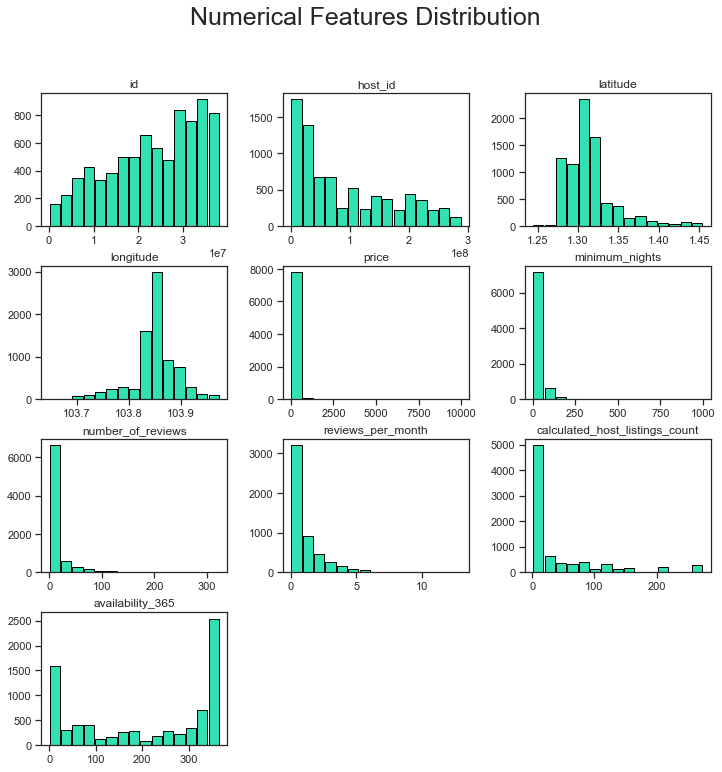

In [89]:
#Create a Histogram of Dataframe columns with 15 bins
df_regression.hist(edgecolor = 'black', bins = 15, grid = False, figsize = (12,12),
                      color = '#32E1B1', zorder = 2, rwidth = 0.9)

#Add a centred suptitle to the figure
plt.suptitle("Numerical Features Distribution", fontsize = 25)
plt.show()

### Scatterplot of Longitude and Latitude of the various neighbourhood group

C:\Users\shiny\anaconda3\MachineLearning\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



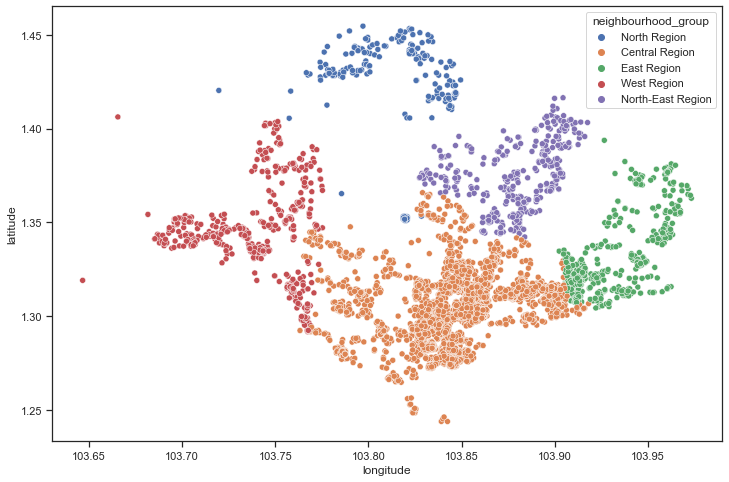

In [90]:
# Draw a scatter plot for the distribution of longitude and latittude of the neeghbourhood
plt.figure(figsize = (12, 8))
sns.scatterplot(df_regression.longitude, df_regression.latitude, hue = df_regression.neighbourhood_group)
plt.show()

### Price Distribution of Listing less than 300 Dollars across Neighbourhood Group

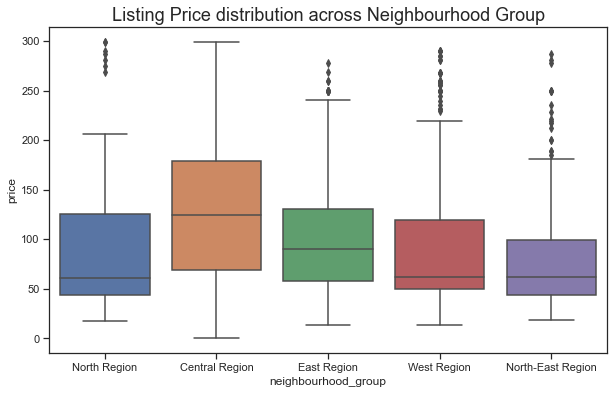

In [91]:
#temporarily store listing price that are below 300 dollars to 
#prevent extreme outliers from distorting the boxplot distribution
neighbour_group = df_regression[df_regression.price <300]
plt.figure(figsize=(10,6))

#Draw a box plot to show distributions with respect to the various neighbourhood group
sns.boxplot(y="price",x ='neighbourhood_group' ,data = neighbour_group)


plt.title("Listing Price distribution across Neighbourhood Group", fontsize = 18)
plt.show()

### Frequency of Listings across Neighbourhood Group

C:\Users\shiny\anaconda3\MachineLearning\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



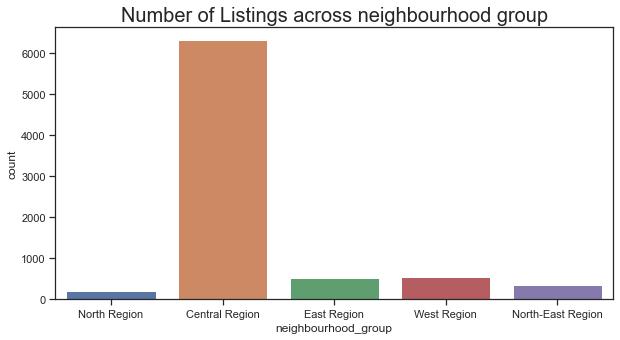

In [92]:
#Show the counts of observations in each categorical bin (neighbourhood_group) using bars.
sns.countplot(df_regression["neighbourhood_group"])

#Customize seaborn figure size with an aspect ratio of 15 by 8
sns.set(rc = {'figure.figsize':(15,8)})
plt.title("Number of Listings across neighbourhood group", fontsize = 20)
plt.show()

### Price Distribution of Listings across various Room Type

<Figure size 1080x720 with 0 Axes>

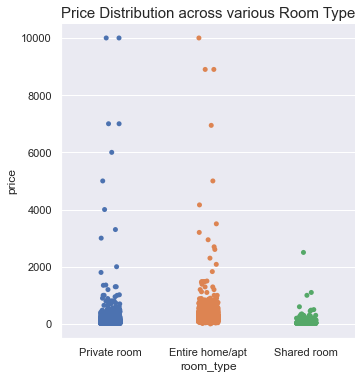

In [93]:
#catplot room type and price
plt.figure(figsize=(15,10))

#Create a vertical strip plot (catplot) with the price distribution of listings across various room types
sns.catplot(x="room_type", y="price", data=df);

plt.title("Price Distribution across various Room Type", fontsize = 15)
plt.show()

### Proportion of Listings based on Room Type

In [94]:
# Generate graphs offline and save them in local machine
import plotly.offline as pyo

# Enable usage of creating a new figure/class
import plotly.graph_objs as go

#Compute the Number of rows for each room types divided by the total count of listings multiplied by 100
#to obtain the percentage 
roomdf = df.groupby('room_type').size()/df['room_type'].count()*100

# refer the individual room type within an iterable by its position
labels = roomdf.index

# Return a numpy distribution of the various room type
values = roomdf.values
# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.6)])
fig.show()

### Relationship of Number of Reviews against Price by Room Type

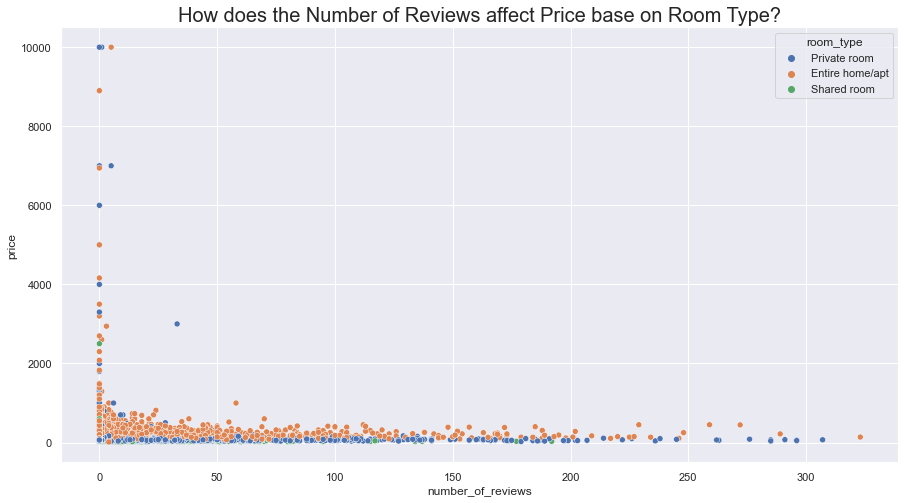

In [95]:
#Draw a scatterplot to plot the number of reviews against the price across various room type
sns.scatterplot(x="number_of_reviews", y="price",hue='room_type' , data=df_regression)
plt.title("How does the Number of Reviews affect Price base on Room Type?", fontsize = 20)
plt.show()

### Relationship of Minimum Nights against Price by Room Type

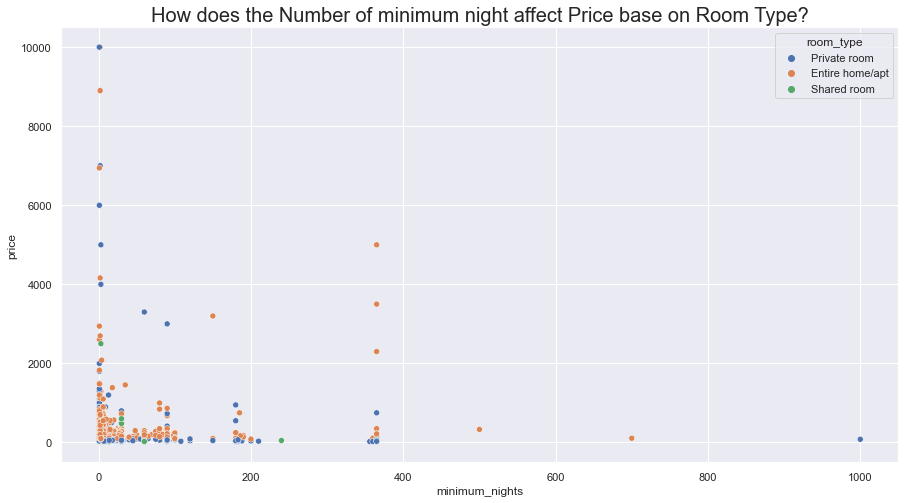

In [96]:
#Draw a scatterplot to plot the number of minimum nights against the price across various room type
sns.scatterplot(x="minimum_nights", y="price",hue='room_type' , data=df_regression)
plt.title("How does the Number of minimum night affect Price base on Room Type?", fontsize = 20)
plt.show()

### Median Number of Days a Listing is available for Booking based on Room Type

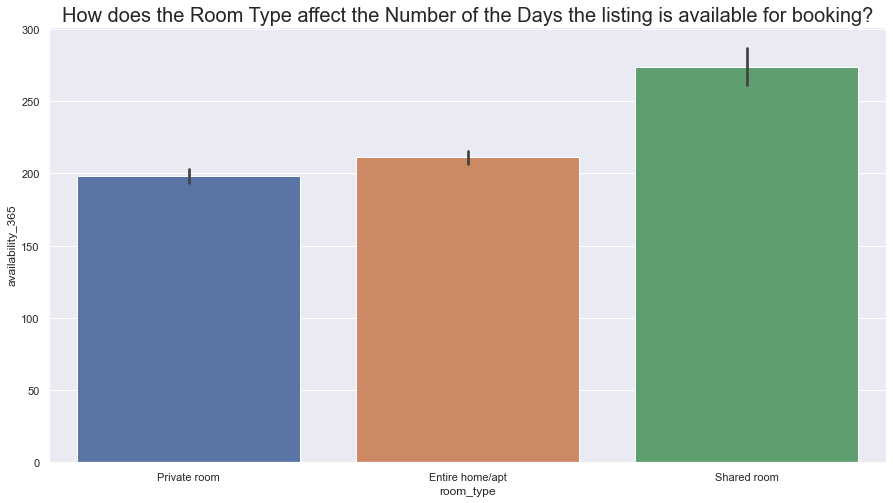

In [97]:
#Obtain the median number of days each room type is available for booking
result = df_regression.groupby(["room_type"])['availability_365'].aggregate(np.median).reset_index().sort_values('availability_365')

#plot a vertical bar plot showing the number of days the room is available for booking across room type in the order it was previously grouped
sns.barplot(x='room_type', y="availability_365", data=df, order=result['room_type'])
plt.title("How does the Room Type affect the Number of the Days the listing is available for booking?", fontsize = 20)

plt.show()

### 2.2 Cleanse and Transform the data

### Step 1 - Verification and Removal of Duplicate records

In [98]:
def remove_duplicate(df_regression):
    #Retrieve the number of rows present before removing the duplicate
    print("BEFORE REMOVING DUPLICATES - No. of Rows = ",df_regression.shape[0])
    
    #Drop any duplicates found after the first presence of a particular record
    df_regression.drop_duplicates(keep="first", inplace=True) 
    
    #Retrieve the number of rows present after removing the duplicate
    print("AFTER REMOVING DUPLICATES  - No. of Rows = ",df_regression.shape[0])
    
    #Validation message
    return "Performed check for duplicate rows"

# Remove Duplicates from "train" data:
remove_duplicate(df_regression)   

BEFORE REMOVING DUPLICATES - No. of Rows =  7907
AFTER REMOVING DUPLICATES  - No. of Rows =  7907


'Performed check for duplicate rows'

### Step 2.1 - Checking for Various Types of Null Values in Dataframe

In [99]:
# To verify that there are no other types of missing values, an easy way is to make a list of missing value types
missing_values = ["n/a", "na", "N.A.", "--"]

#Check for list of na values as listed previously in the listings.csv file
df_regression = pd.read_csv('listings.csv', na_values = missing_values)

#Return boolean value on whether there is presence of null value in the respective column
df_regression.isnull().any()

id                                False
name                               True
host_id                           False
host_name                         False
neighbourhood_group               False
neighbourhood                     False
latitude                          False
longitude                         False
room_type                         False
price                             False
minimum_nights                    False
number_of_reviews                 False
last_review                        True
reviews_per_month                  True
calculated_host_listings_count    False
availability_365                  False
dtype: bool

### Step 2.2 - Number of Null Values in Dataframe

In [100]:
#Calculate the sum of missing values in 
df_regression.isnull().sum() 

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
dtype: int64

### Step 2.3 - Proportion of Null Values in Dataframe

In [101]:
#obtain the percentage of null values in each of the feature
(df_regression.isnull().sum()/df_regression.shape[0])*100

id                                 0.000000
name                               0.025294
host_id                            0.000000
host_name                          0.000000
neighbourhood_group                0.000000
neighbourhood                      0.000000
latitude                           0.000000
longitude                          0.000000
room_type                          0.000000
price                              0.000000
minimum_nights                     0.000000
number_of_reviews                  0.000000
last_review                       34.880486
reviews_per_month                 34.880486
calculated_host_listings_count     0.000000
availability_365                   0.000000
dtype: float64

### Step 3.1 - Drop Name and Redudant Features as Part of Missing Value Treatment

In [102]:
#Create a list of features to be dropped
dropped_columns = ['id','name', 'host_id','host_name', 'latitude', 'longitude']
#Drop columns with the provided list
df_regression.drop(dropped_columns, axis = 'columns', inplace = True)
df_regression.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,North Region,Woodlands,Private room,83,180,1,2013-10-21,0.01,2,365
1,Central Region,Bukit Timah,Private room,81,90,18,2014-12-26,0.28,1,365
2,North Region,Woodlands,Private room,69,6,20,2015-10-01,0.20,2,365
3,East Region,Tampines,Private room,206,1,14,2019-08-11,0.15,9,353
4,East Region,Tampines,Private room,94,1,22,2019-07-28,0.22,9,355


### Step 3.2 - Verify that Name Feature has been Removed with other Redundant Features

In [103]:
#Check number of null values left for each of the remaining features
df_regression.isnull().sum()

neighbourhood_group                  0
neighbourhood                        0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
dtype: int64

### Step 4.1 - Convert last_review to DateTime Object

In [104]:
#Convert the last_review column to a datetime object
temp = pd.to_datetime(df_regression['last_review'])
temp

0      2013-10-21
1      2014-12-26
2      2015-10-01
3      2019-08-11
4      2019-07-28
          ...    
7902          NaT
7903          NaT
7904          NaT
7905          NaT
7906          NaT
Name: last_review, Length: 7907, dtype: datetime64[ns]

### Step 4.2 - Transform Last_Review column to number of Days since last review

In [105]:
from datetime import date

#Get the current date
today = date.today()

#Calculate the difference between current date from the date value to obtain the number of days since the last review
df_regression['last_review'] = (pd.Timestamp('today')-temp)/np.timedelta64(1,'D')

#With the number of days obtained, calculate the median the number of days since last review to impute into the null columns
df_regression['last_review'] = df_regression['last_review'].fillna(df_regression['last_review'].median())

#Convert column to integer values
df_regression['last_review'] = df_regression['last_review'].astype(int)
df_regression['last_review']

0       3028
1       2597
2       2318
3        908
4        922
        ... 
7902     953
7903     953
7904     953
7905     953
7906     953
Name: last_review, Length: 7907, dtype: int32

### Step 5.1 - Impute Reviews_per_month Feature with 0

In [106]:
#Fill NA Values by imputing null values with 0
df_regression['reviews_per_month'] = df_regression['reviews_per_month'].fillna(0)

### Step 5.2 - Verify the presence of Null Values

In [107]:
#Check the number of null values left for all columns
df_regression.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [108]:
#Verify that the total number of non-null count tallies with the total number of entries
df_regression.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             7907 non-null   object 
 1   neighbourhood                   7907 non-null   object 
 2   room_type                       7907 non-null   object 
 3   price                           7907 non-null   int64  
 4   minimum_nights                  7907 non-null   int64  
 5   number_of_reviews               7907 non-null   int64  
 6   last_review                     7907 non-null   int32  
 7   reviews_per_month               7907 non-null   float64
 8   calculated_host_listings_count  7907 non-null   int64  
 9   availability_365                7907 non-null   int64  
dtypes: float64(1), int32(1), int64(5), object(3)
memory usage: 587.0+ KB


### Step 6.1 Check Unique Values in Neighbourhood Group

In [109]:
#Obtain the unique values found in the neighbourhood group column
df_regression['neighbourhood_group'].unique()

array(['North Region', 'Central Region', 'East Region', 'West Region',
       'North-East Region'], dtype=object)

### Step 6.2 Customized Price Prediction Model with East, West, and Central Region Only

In [110]:
#Drop records whereby the records has a neighbourhood group belonging to the north or north east region
df_regression = df_regression[(df_regression.neighbourhood_group != 'North Region') & 
                              (df_regression.neighbourhood_group != 'North-East Region')]

#Check unique values in neighbourhood group to verify that north and north east records have been dropped
df_regression['neighbourhood_group'].unique()

array(['Central Region', 'East Region', 'West Region'], dtype=object)

### Step 7.1 Plot Distribution of Airbnb Pricing

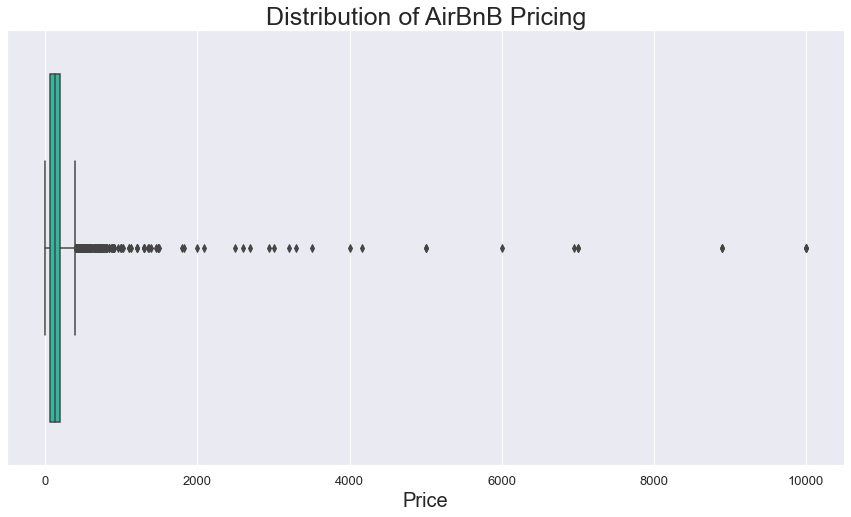

In [111]:
#Plot boxplot to illustrate price distribution
sns.boxplot(x = df_regression["price"], color = '#15D2AD')

plt.title("Distribution of AirBnB Pricing", fontsize=25)

#Set x axis title label as price
plt.xlabel('Price', fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

### Step 7.2 Obtain 25th and 75th Percentile of Price

In [112]:
#Obtain price summary of the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.
df_regression['price'].describe()

count     7357.000000
mean       174.224956
std        350.124159
min          0.000000
25%         69.000000
50%        129.000000
75%        200.000000
max      10000.000000
Name: price, dtype: float64

### Step 7.3 Verify 25th and 75th Percentile of Price

In [113]:
#Obtain the 25th percentile of price distribution
Q1 = df_regression.price.quantile(0.25)

#Obtain the 75th percentile of price distribution
Q3 = df_regression.price.quantile(0.75)
Q1, Q3

(69.0, 200.0)

### Step 7.4 Calculate IQR

In [114]:
#Obtain the IQR range by subtracting the 75th percentile value by the 25th percentile value
IQR = Q3 - Q1
IQR

131.0

### Step 7.5 Obtain IQR from Lower and Upper Limit

In [115]:
#Obtain the lower limit value by taking the 25th percentile - 1.5*IQR value
lower_limit = Q1-1.5*IQR

#Obtain the upper limit value by taking the 75th percentile + 1.5*IQR value
upper_limit = Q3 + 1.5*IQR
lower_limit, upper_limit

(-127.5, 396.5)

### Step 7.6 Customized Price Prediction Model within lower and upper limit Price Range

In [116]:
#Obtain summary of the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.
df_regression = df_regression[(df_regression.price>lower_limit)&(df_regression.price<upper_limit)]
df_regression['price'].describe()

count    7017.000000
mean      137.877441
std        84.736948
min         0.000000
25%        68.000000
50%       122.000000
75%       187.000000
max       394.000000
Name: price, dtype: float64

### Step 7.6 Check the No. of Records Left after obtaining Subset of Price and Region

In [117]:
#Check the number of records left after obtaining the subset of price and region
df_regression.info()
#Write object to a comma-separated values (csv) file.
df_regression.to_csv('listings_new_OneHotEncoding.csv', index = False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7017 entries, 1 to 7906
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             7017 non-null   object 
 1   neighbourhood                   7017 non-null   object 
 2   room_type                       7017 non-null   object 
 3   price                           7017 non-null   int64  
 4   minimum_nights                  7017 non-null   int64  
 5   number_of_reviews               7017 non-null   int64  
 6   last_review                     7017 non-null   int32  
 7   reviews_per_month               7017 non-null   float64
 8   calculated_host_listings_count  7017 non-null   int64  
 9   availability_365                7017 non-null   int64  
dtypes: float64(1), int32(1), int64(5), object(3)
memory usage: 575.6+ KB


### Step 8.1 Ordinal Encoding of Neighbourhood Group Column

In [118]:
#Create mappping list to encode west region to 0, central region to 1, and East region to 2
neighbour_group_mapping = {"West Region":0, "Central Region":1, "East Region":2}
#Perform mapping by using the mapping list to map the values
df_regression['neighbourhood_group'] = df_regression['neighbourhood_group'].map(neighbour_group_mapping).astype(int)
df_regression.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1,1,Bukit Timah,Private room,81,90,18,2597,0.28,1,365
3,2,Tampines,Private room,206,1,14,908,0.15,9,353
4,2,Tampines,Private room,94,1,22,922,0.22,9,355
5,2,Tampines,Private room,104,1,39,904,0.38,9,346
6,2,Tampines,Private room,208,1,25,925,0.25,9,172


In [119]:
#Verify the unique values in neighbourhood group column
df_regression['neighbourhood_group'].unique()

array([1, 2, 0])

### Step 8.2 Ordinal Encoding of Neighbourhood Column

In [120]:
#View the unique values found in the neighbourhood column
df_regression['neighbourhood'].unique()

array(['Bukit Timah', 'Tampines', 'Bedok', 'Bukit Merah', 'Newton',
       'Geylang', 'River Valley', 'Jurong West', 'Rochor', 'Queenstown',
       'Marine Parade', 'Pasir Ris', 'Toa Payoh', 'Outram', 'Tanglin',
       'Kallang', 'Novena', 'Downtown Core', 'Bukit Panjang',
       'Singapore River', 'Orchard', 'Bukit Batok', 'Museum',
       'Choa Chu Kang', 'Clementi', 'Jurong East', 'Bishan',
       'Western Water Catchment', 'Southern Islands'], dtype=object)

In [121]:
#Map neighbourhood from 0 to the length-1 of total unique values in the list
neighbour_mapping = {"Bukit Timah":0, "Tampines":1, "Bedok":2, "Bukit Merah":3, "Newton":4,
                           "Geylang":5, "River Valley":6, "Jurong West":7, "Rochor":8, "Queenstown":9,
                          "Marine Parade":10, "Pasir Ris":11, "Toa Payoh":12, "Outram":13, "Tanglin":14,
                          "Kallang":15, "Novena":16, "Downtown Core":17, "Bukit Panjang":18,
                         "Singapore River":19, "Orchard":20, "Bukit Batok":21, "Museum":22,
                     "Choa Chu Kang":23, "Clementi":24,"Jurong East":25, "Bishan":26,
                    "Southern Islands":27, "Western Water Catchment":28, "Tuas":29, "Marina South":30}

#Perform mapping of values using the mapping list of values
df_regression['neighbourhood'] = df_regression['neighbourhood'].map(neighbour_mapping).astype(int)
df_regression.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1,1,0,Private room,81,90,18,2597,0.28,1,365
3,2,1,Private room,206,1,14,908,0.15,9,353
4,2,1,Private room,94,1,22,922,0.22,9,355
5,2,1,Private room,104,1,39,904,0.38,9,346
6,2,1,Private room,208,1,25,925,0.25,9,172


In [122]:
#Verify the unqiue values in the neighbourhood column
df_regression['neighbourhood'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 27])

### Step 8.3 Ordinal Encoding of Room Type Column

In [123]:
#Check for the unique values in room type
df_regression['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

In [124]:
#perform mapping of values in the strict order of Shared room, Private room, followed by Entire home/apt from 0 to 2
room_mapping = {"Shared room":0, "Private room":1, "Entire home/apt":2}

#perform mapping using the room_mapping list of mapping values
df_regression['room_type'] = df_regression['room_type'].map(room_mapping).astype(int)
df_regression.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1,1,0,1,81,90,18,2597,0.28,1,365
3,2,1,1,206,1,14,908,0.15,9,353
4,2,1,1,94,1,22,922,0.22,9,355
5,2,1,1,104,1,39,904,0.38,9,346
6,2,1,1,208,1,25,925,0.25,9,172


In [125]:
#Verify the unqiue values in the room type column
df_regression['room_type'].unique()

array([1, 2, 0])

### Step 8.4 Verify that Columns with Object DataType has been Converted to Int32

In [126]:
#Check that the there are no object datatypes left
df_regression.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7017 entries, 1 to 7906
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             7017 non-null   int32  
 1   neighbourhood                   7017 non-null   int32  
 2   room_type                       7017 non-null   int32  
 3   price                           7017 non-null   int64  
 4   minimum_nights                  7017 non-null   int64  
 5   number_of_reviews               7017 non-null   int64  
 6   last_review                     7017 non-null   int32  
 7   reviews_per_month               7017 non-null   float64
 8   calculated_host_listings_count  7017 non-null   int64  
 9   availability_365                7017 non-null   int64  
dtypes: float64(1), int32(4), int64(5)
memory usage: 493.4 KB


### Step 9.1 View Distribution and Data Skewness of Reviews Per Month

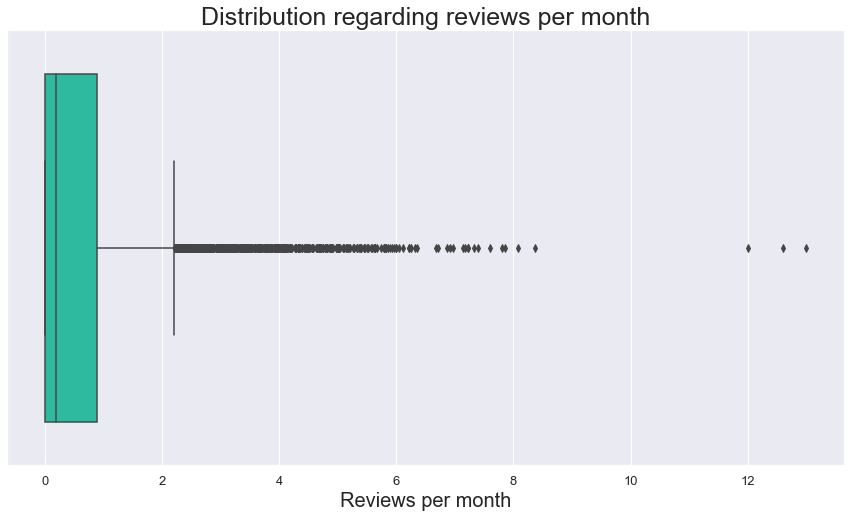

In [127]:
#Plot boxplot distribution of reviews_per_month
sns.boxplot(x = df_regression["reviews_per_month"], color = '#15D2AD')

#set title of seaborn boxplot
plt.title("Distribution regarding reviews per month", fontsize=25)

#Display title of x-axis label, reviews_per_month
plt.xlabel('Reviews per month', fontsize=20)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

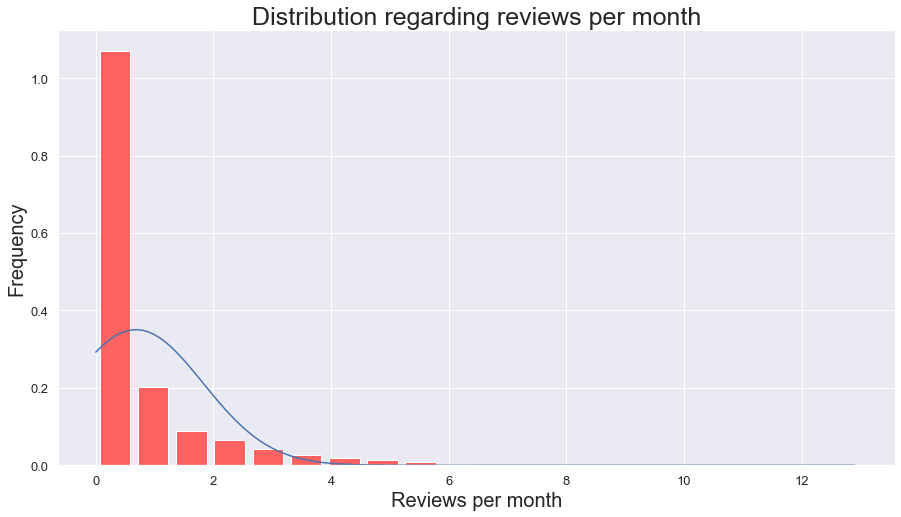

In [128]:
#Create a histogram illustrating the reviews per month distribution with a total of 20 bins
plt.hist(df_regression.reviews_per_month, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to age and frequency respectively
plt.xlabel('Reviews per month', fontsize=20)
plt.ylabel('Frequency', fontsize=20)


#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_regression.reviews_per_month.min(), df_regression.reviews_per_month.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_regression.reviews_per_month.mean(),df_regression.reviews_per_month.std()))
plt.title("Distribution regarding reviews per month", fontsize=25)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

plt.show()

### Step 9.2 Perform Log Transformation on Reviews Per Month

In [129]:
#Perform log transformation on the reviews per month column 
df_regression.reviews_per_month = np.log1p(df_regression.reviews_per_month)

# Display Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values
df_regression.describe()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
count,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000
mean,0.994870,10.829557,1.480975,137.877441,16.891692,13.126692,1059.565199,0.381145,43.788229,208.619781
std,0.381629,6.311427,0.595463,84.736948,39.853262,29.921215,280.147182,0.479197,67.291383,145.614712
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,892.000000,0.000000,1.000000,0.000000
25%,1.000000,5.000000,1.000000,68.000000,1.000000,0.000000,924.000000,0.000000,2.000000,54.000000
50%,1.000000,10.000000,2.000000,122.000000,3.000000,2.000000,953.000000,0.165514,11.000000,261.000000
75%,1.000000,15.000000,2.000000,187.000000,10.000000,11.000000,1021.000000,0.631272,64.000000,354.000000
max,2.000000,28.000000,2.000000,394.000000,1000.000000,323.000000,2778.000000,2.639057,274.000000,365.000000


### Step 9.3 Changes after performing Log Transformation on Reviews Per Month

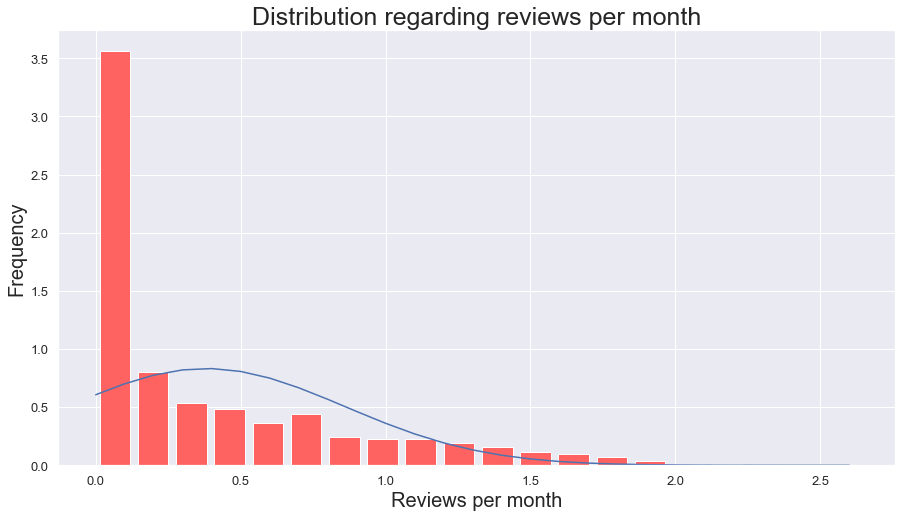

In [130]:
#Create a histogram illustrating the reviews per month distribution with a total of 20 bins
plt.hist(df_regression.reviews_per_month, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to age and frequency respectively
plt.xlabel('Reviews per month', fontsize=20)
plt.ylabel('Frequency', fontsize=20)

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_regression.reviews_per_month.min(), df_regression.reviews_per_month.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_regression.reviews_per_month.mean(),df_regression.reviews_per_month.std()))
plt.title("Distribution regarding reviews per month", fontsize=25)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

plt.show()

### Step 10.1 View Distribution and Data Skewness of Number of Reviews

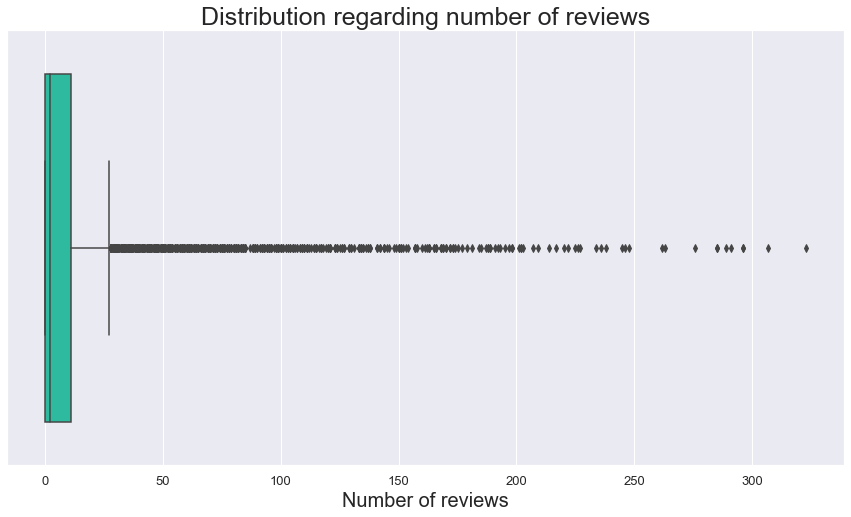

In [131]:
#Create a boxplot illustrating the distribution of number of reviews
sns.boxplot(x = df_regression["number_of_reviews"], color = '#15D2AD')

#set title of seaborn boxplot
plt.title("Distribution regarding number of reviews", fontsize=25)

#Set the X axis title label to 'Age'
plt.xlabel('Number of reviews', fontsize=20)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

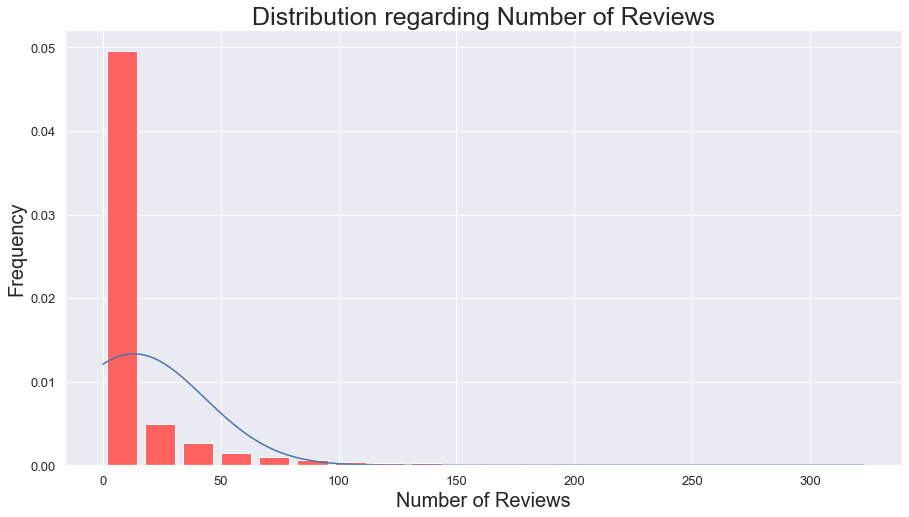

In [132]:
#Create a histogram illustrating the number of reviews distribution with a total of 20 bins
plt.hist(df_regression.number_of_reviews, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to age and frequency respectively
plt.xlabel('Number of Reviews', fontsize=20)
plt.ylabel('Frequency', fontsize=20)

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_regression.number_of_reviews.min(), df_regression.number_of_reviews.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_regression.number_of_reviews.mean(),df_regression.number_of_reviews.std()))
plt.title("Distribution regarding Number of Reviews", fontsize=25)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

plt.show()

### Step 10.2 Perform Log Transformation on Number Of Reviews

In [133]:
#Perform log transformation on the number of reviews column 
df_regression.number_of_reviews = np.log1p(df_regression.number_of_reviews)

# Display Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values
df_regression.describe()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
count,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000
mean,0.994870,10.829557,1.480975,137.877441,16.891692,1.430587,1059.565199,0.381145,43.788229,208.619781
std,0.381629,6.311427,0.595463,84.736948,39.853262,1.450879,280.147182,0.479197,67.291383,145.614712
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,892.000000,0.000000,1.000000,0.000000
25%,1.000000,5.000000,1.000000,68.000000,1.000000,0.000000,924.000000,0.000000,2.000000,54.000000
50%,1.000000,10.000000,2.000000,122.000000,3.000000,1.098612,953.000000,0.165514,11.000000,261.000000
75%,1.000000,15.000000,2.000000,187.000000,10.000000,2.484907,1021.000000,0.631272,64.000000,354.000000
max,2.000000,28.000000,2.000000,394.000000,1000.000000,5.780744,2778.000000,2.639057,274.000000,365.000000


### Step 10.3 Changes after performing Log Transformation on Number of Reviews

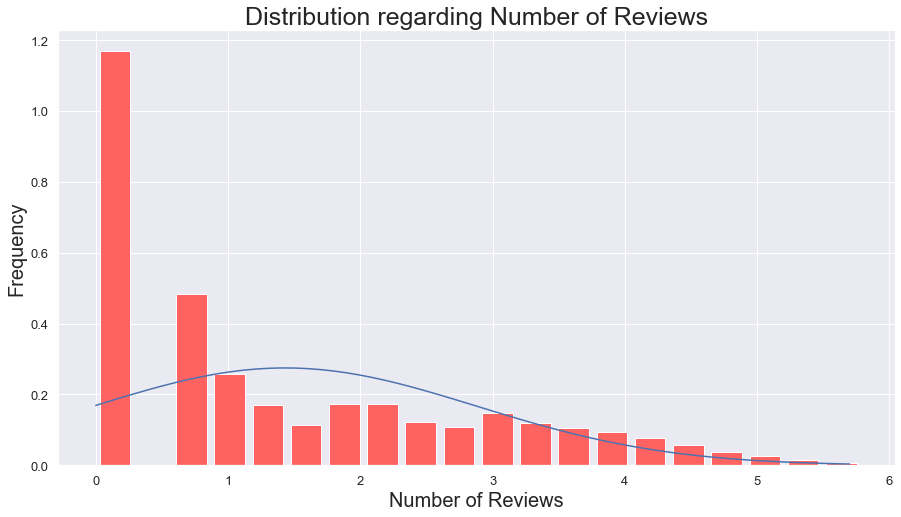

In [134]:
#Create a histogram illustrating the number of reviews distribution with a total of 20 bins
plt.hist(df_regression.number_of_reviews, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to number of reviews and frequency respectively
plt.xlabel('Number of Reviews', fontsize=20)
plt.ylabel('Frequency', fontsize=20)

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_regression.number_of_reviews.min(), df_regression.number_of_reviews.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_regression.number_of_reviews.mean(),df_regression.number_of_reviews.std()))
plt.title("Distribution regarding Number of Reviews", fontsize=25)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

### Step 11.1 View Distribution and Data Skewness of Minimum Nights

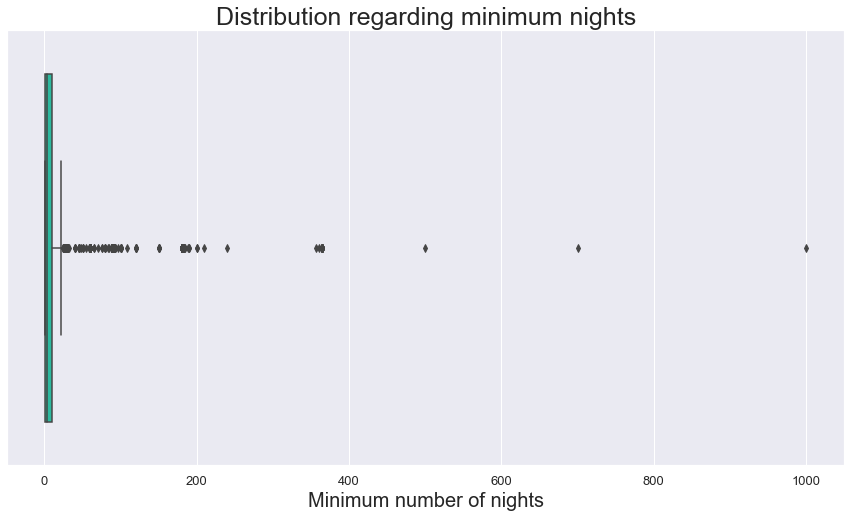

In [135]:
#Create a boxplot illustrating the distribution of minimum_nights
sns.boxplot(x = df_regression["minimum_nights"], color = '#15D2AD')

#set title of seaborn boxplot
plt.title("Distribution regarding minimum nights", fontsize=25)

#Set the X axis title label to minimum_nights
plt.xlabel('Minimum number of nights', fontsize=20)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

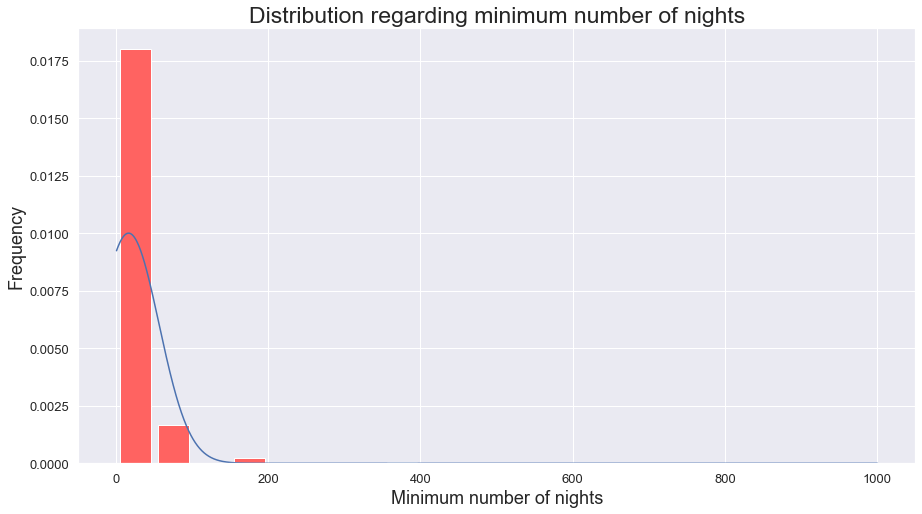

In [136]:
#Create a histogram illustrating the minimum_nights distribution with a total of 20 bins
plt.hist(df_regression.minimum_nights, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to minimum_nights and frequency respectively
plt.xlabel('Minimum number of nights', fontsize=18)
plt.ylabel('Frequency', fontsize=18)

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_regression.minimum_nights.min(), df_regression.minimum_nights.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_regression.minimum_nights.mean(),df_regression.minimum_nights.std()))
plt.title("Distribution regarding minimum number of nights", fontsize=23)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

plt.show()

### Step 11.2 Perform Log Transformation on Minimum Nights

In [137]:
#Perform log transformation on the minimum_nights column 
df_regression.minimum_nights = np.log1p(df_regression.minimum_nights)

# Display Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values
df_regression.describe()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
count,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000
mean,0.994870,10.829557,1.480975,137.877441,1.846867,1.430587,1059.565199,0.381145,43.788229,208.619781
std,0.381629,6.311427,0.595463,84.736948,1.240776,1.450879,280.147182,0.479197,67.291383,145.614712
min,0.000000,0.000000,0.000000,0.000000,0.693147,0.000000,892.000000,0.000000,1.000000,0.000000
25%,1.000000,5.000000,1.000000,68.000000,0.693147,0.000000,924.000000,0.000000,2.000000,54.000000
50%,1.000000,10.000000,2.000000,122.000000,1.386294,1.098612,953.000000,0.165514,11.000000,261.000000
75%,1.000000,15.000000,2.000000,187.000000,2.397895,2.484907,1021.000000,0.631272,64.000000,354.000000
max,2.000000,28.000000,2.000000,394.000000,6.908755,5.780744,2778.000000,2.639057,274.000000,365.000000


### Step 11.3 Changes after performing Log Transformation on Minimum Nights

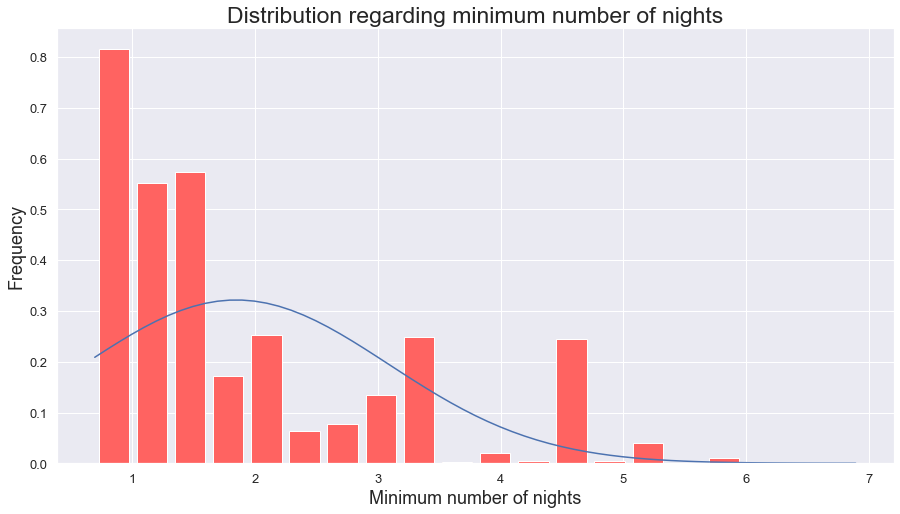

In [138]:
#Create a histogram illustrating the minimum_nights distribution with a total of 20 bins
plt.hist(df_regression.minimum_nights, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to length of service and frequency respectively
plt.xlabel('Minimum number of nights', fontsize=18)
plt.ylabel('Frequency', fontsize=18)

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_regression.minimum_nights.min(), df_regression.minimum_nights.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_regression.minimum_nights.mean(),df_regression.minimum_nights.std()))
plt.title("Distribution regarding minimum number of nights", fontsize=23)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

plt.show()

### Step 12.1 View Distribution and Data Skewness of Calculated Host Listings Count

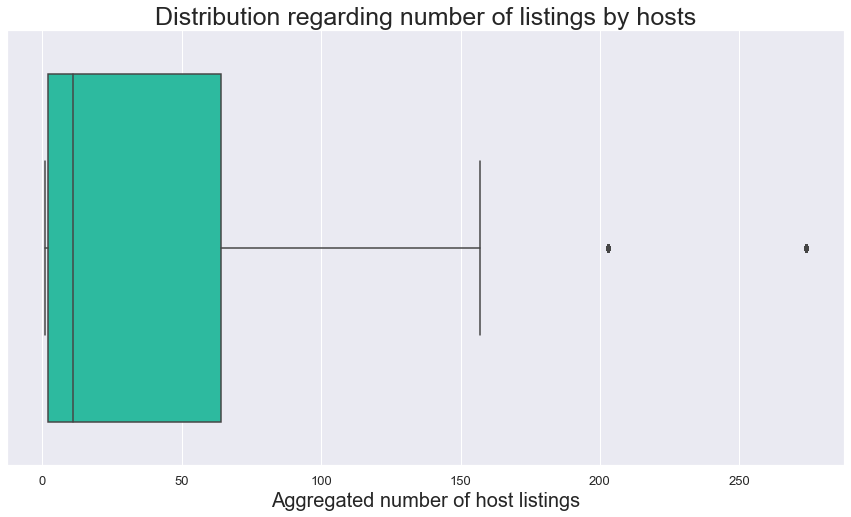

In [139]:
#Create a boxplot illustrating the distribution of Calculated Host Listings Count
sns.boxplot(x = df_regression["calculated_host_listings_count"], color = '#15D2AD')

#set title of seaborn boxplot
plt.title("Distribution regarding number of listings by hosts", fontsize=25)

#Set the X axis title label to Calculated Host Listings Count
plt.xlabel('Aggregated number of host listings', fontsize=20)

#Set the font size of x tick present to 13
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

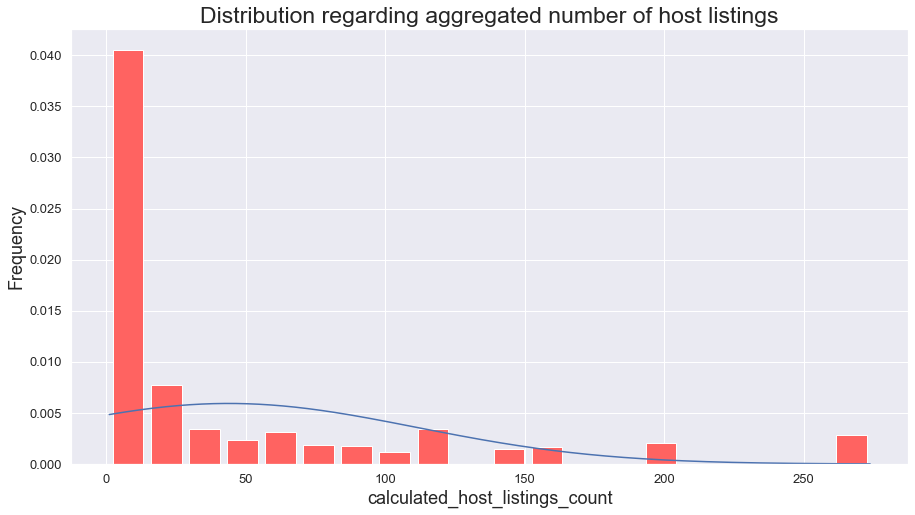

In [140]:
#Create a histogram illustrating the length of service distribution with a total of 20 bins
plt.hist(df_regression.calculated_host_listings_count, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to length of service and frequency respectively
plt.xlabel('calculated_host_listings_count', fontsize=18)
plt.ylabel('Frequency', fontsize=18)

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_regression.calculated_host_listings_count.min(), df_regression.calculated_host_listings_count.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_regression.calculated_host_listings_count.mean(),df_regression.calculated_host_listings_count.std()))
plt.title("Distribution regarding aggregated number of host listings", fontsize=23)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

plt.show()

### Step 12.2 Perform Log Transformation on Calculated Host Listings Count

In [141]:
#Perform log transformation on the Calculated Host Listings Count 
df_regression.calculated_host_listings_count = np.log1p(df_regression.calculated_host_listings_count)

# Display Descriptive statistics including those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values
df_regression.describe()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
count,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000,7017.000000
mean,0.994870,10.829557,1.480975,137.877441,1.846867,1.430587,1059.565199,0.381145,2.638049,208.619781
std,0.381629,6.311427,0.595463,84.736948,1.240776,1.450879,280.147182,0.479197,1.606358,145.614712
min,0.000000,0.000000,0.000000,0.000000,0.693147,0.000000,892.000000,0.000000,0.693147,0.000000
25%,1.000000,5.000000,1.000000,68.000000,0.693147,0.000000,924.000000,0.000000,1.098612,54.000000
50%,1.000000,10.000000,2.000000,122.000000,1.386294,1.098612,953.000000,0.165514,2.484907,261.000000
75%,1.000000,15.000000,2.000000,187.000000,2.397895,2.484907,1021.000000,0.631272,4.174387,354.000000
max,2.000000,28.000000,2.000000,394.000000,6.908755,5.780744,2778.000000,2.639057,5.616771,365.000000


### Step 12.3 Changes after performing Log Transformation on Calculated Host Listings Count

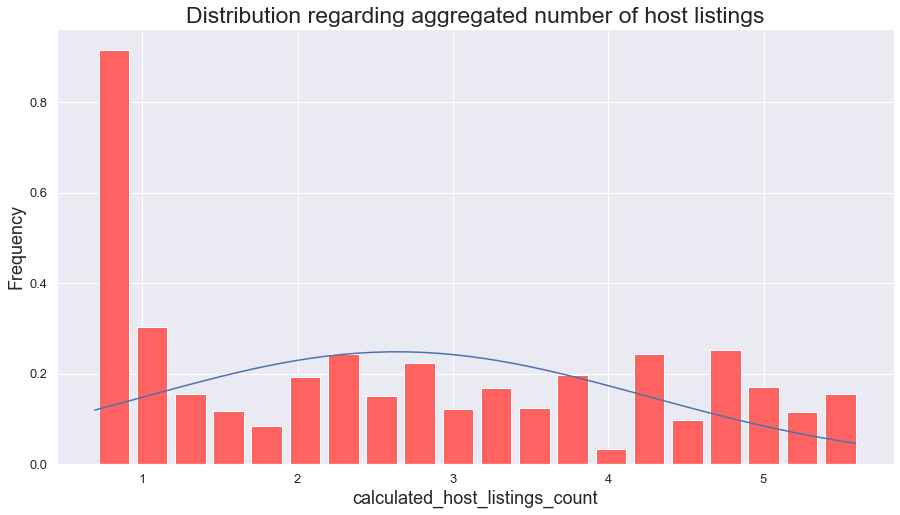

In [142]:
#Create a histogram illustrating the Calculated Host Listings Count distribution with a total of 20 bins
plt.hist(df_regression.calculated_host_listings_count, bins = 20, rwidth = 0.8, density = True, color = '#ff6361')

#set x label and ylabel to length of service and frequency respectively
plt.xlabel('calculated_host_listings_count', fontsize=18)
plt.ylabel('Frequency', fontsize=18)

#Plot the bell-shaped curve/line of a normal distribution
rng = np.arange(df_regression.calculated_host_listings_count.min(), df_regression.calculated_host_listings_count.max(), 0.1)
plt.plot(rng, norm.pdf(rng, df_regression.calculated_host_listings_count.mean(),df_regression.calculated_host_listings_count.std()))
plt.title("Distribution regarding aggregated number of host listings", fontsize=23)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

plt.show()

### 2.3 Correlation Analysis

### Pairwise Correlation of Columns

In [143]:
# This method shows the correlations between the various variables
df_regression.corr()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood_group,1.000000,-0.466547,0.005215,0.008417,-0.018580,0.063683,-0.008873,0.057398,0.000372,-0.017302
neighbourhood,-0.466547,1.000000,-0.021987,0.067360,0.097298,-0.055396,0.023033,-0.052538,0.047054,0.071004
room_type,0.005215,-0.021987,1.000000,0.613694,0.143894,-0.028974,-0.089820,0.021310,0.313051,-0.045461
price,0.008417,0.067360,0.613694,1.000000,-0.037254,-0.065956,-0.087573,0.005979,0.228316,0.098406
minimum_nights,-0.018580,0.097298,0.143894,-0.037254,1.000000,-0.255727,0.077119,-0.290168,0.176076,0.219907
number_of_reviews,0.063683,-0.055396,-0.028974,-0.065956,-0.255727,1.000000,-0.025462,0.806252,-0.161165,-0.104371
last_review,-0.008873,0.023033,-0.089820,-0.087573,0.077119,-0.025462,1.000000,-0.252838,-0.179843,-0.149603
reviews_per_month,0.057398,-0.052538,0.021310,0.005979,-0.290168,0.806252,-0.252838,1.000000,-0.151057,-0.110404
calculated_host_listings_count,0.000372,0.047054,0.313051,0.228316,0.176076,-0.161165,-0.179843,-0.151057,1.000000,0.430108
availability_365,-0.017302,0.071004,-0.045461,0.098406,0.219907,-0.104371,-0.149603,-0.110404,0.430108,1.000000


### Pairwise Pearson Correlation Heatmap

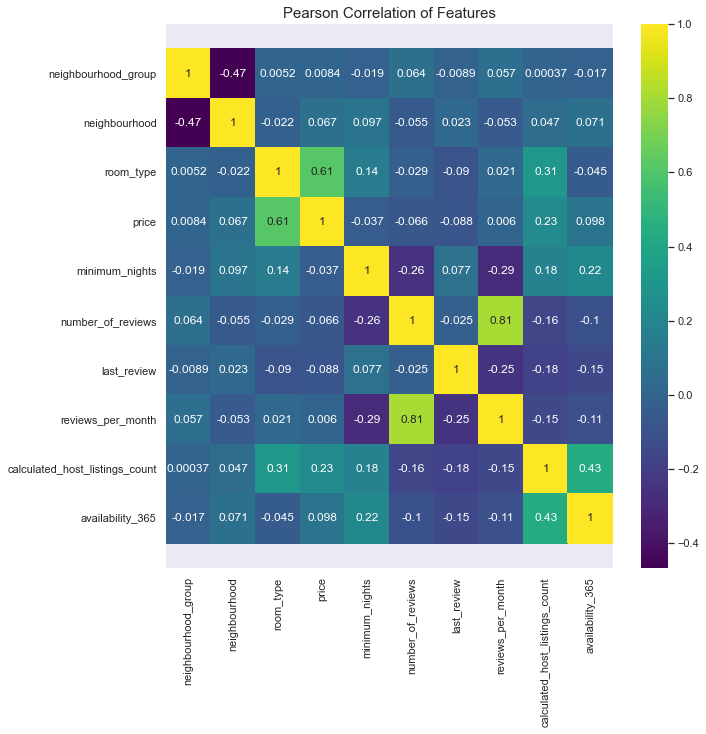

In [144]:
#utilise matplotlib's built-in colormap
colormap = plt.cm.viridis
plt.figure(figsize = (10,10))
plt.title('Pearson Correlation of Features', size = 15)

#Plot a rectangular dataframe as a color-encoded matrix.
ax = sns.heatmap(df_regression.astype(float).corr(), cmap = colormap, annot = True)

#Returns the y-axis view limits.
bottom, top = ax.get_ylim()

# Set the y-axis view limits.
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

### Scatter Matrix of Columns

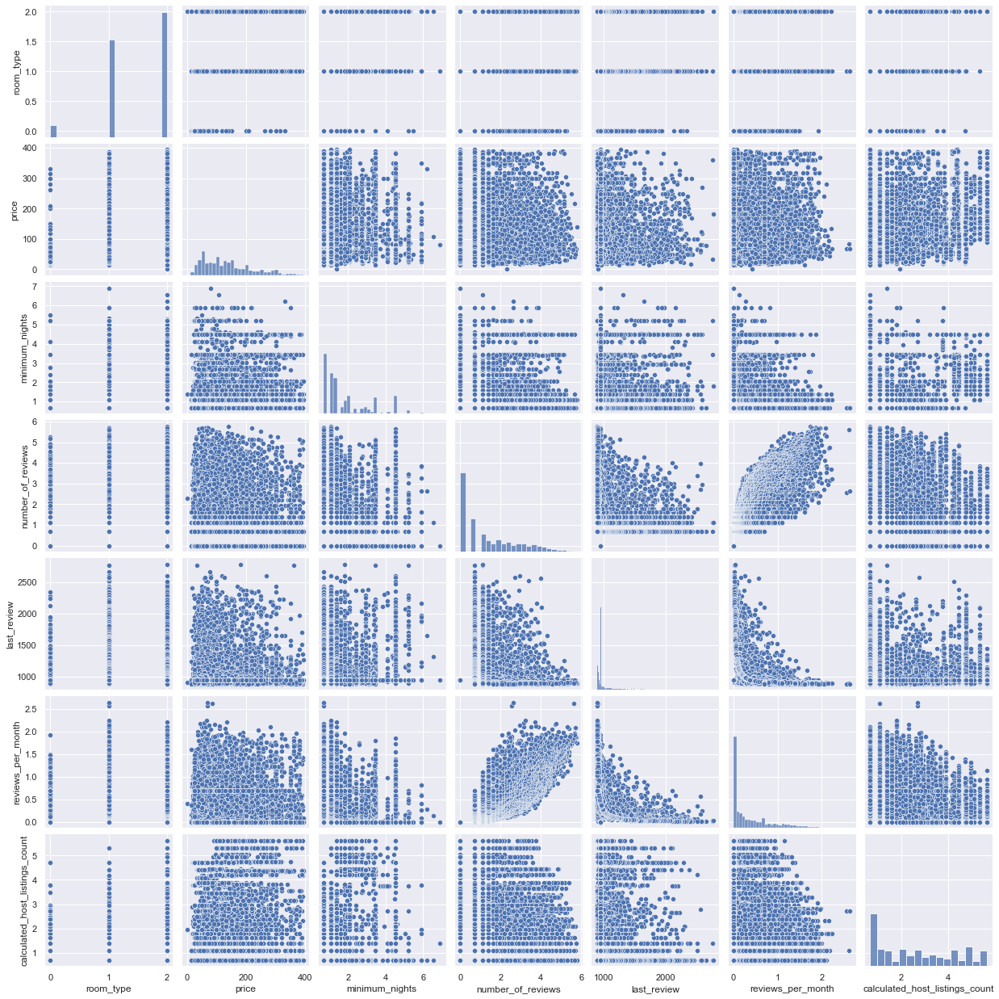

In [145]:
#scatter matrix
#Plot pairwise relationships in a dataset for is_promoted, region, education, age, previous_year_rating, length_of_service,
#KPIs_met >80%, awards_won?, avg_training_score
sns.pairplot(df_regression[['room_type', 'price', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 
                    'calculated_host_listings_count']])
plt.show()

### 2.4 Export the data

In [146]:
#Write object to a comma-separated values (csv) file.
df_regression.to_csv('listings_new.csv', index = False)